# Report for the Deep Learning Course
This is a template notebook of your report. Please complete your report with your teammate following these instructions:
- **Rename your notebook** in the format `FirstName1FAMILYNAME1_FirstName2FAMILYNAME2_report2.ipynb`. For example, when the team consists of Johann FAOUZI and Ikko YAMANE, the file name should look like `JohannFAOUZI_IkkoYAMANE_report2.ipynb`.
- Answer in English.
- Please submit your notebook on Moodle.
- The submission deadline is 18:00 (UTC+2) of December 15, 2024.


**Remarks**:
- The accuracy of your models is not important for the evaluation, but I expect the performance is at least better than a random guess or a constant predictor.
- I encourage you to explain your problem setups/code/algorithms/archtectures/methods/tools/results with Python comments or Markdown text. You can use figures, plots, or other visualization techniques. The quality of explanations will be great part of the evaluation.
- Needless to say, do not copy solutions from other students.
- If your code is based on any articles, code examples, or web pages, **clearly mention the references and how you used them**.
- Likewise, if you use AI tools, clearly explain how you used them and which parts of your answers were given by the AIs, and make sure that you check and understand those parts yourself.
- If I detect any work copied from anywhere else without acknowledging it, your grade will get a **significant penalty**.

## Question 0
Enter your information below.
- Name of Author 1: Franck DEBA WANDJI
- Name of Author 2: Yassine ADJEI-TOURE
- Email address of Author 1: franck-delma.deba-wandji@eleve.ensai.fr
- Email address of Author 2: yassine.adjei-toure@eleve.ensai.fr

## Question 1 (Noun-Verb Classification)

Train two different classifiers for the Noun-Verb dataset [1], which we have seen in the ateliers, and compare their performance.


**References**

[1] Ali Elkahky and Kellie Webster and Daniel Andor and Emily Pitler. A Challenge Set and Methods for Noun-Verb Ambiguity, In *Proceedings of EMNLP*, 2018.

The [Noun-Verb dataset](https://github.com/google-research-datasets/noun-verb )[1] used in the section contained naturally-occuring sentences that feature non-trivial noun-verb ambiguity.

The objective of this section is to train deep learning models to distinguish between noun and verb appearing in the dataset.

Examples :

> Certain insects can damage plumerias, such as mites, **flies**, or aphids. --> *NOUN*

> **Mark** which area you want to distress. --> *VERB*

Codes used to load and process data for this question are copied from the atelier notebook.

### Data loading

The Noun-verb dataset contains the training, evaluation and test sets saved on CONLL format and available on GitHub repository. In this part, we use the library pyconll to access the dataset.

In [ ]:
!pip install pyconll

In [ ]:
def load_dataset(path='data'):
    """Load the noun verb dataset.

    Parameters
    ----------
    path : str
        Path to the directory.

    Returns
    -------
    train : Conll
        Training set.

    validation : Conll
        Validation set.

    test : Conll
        Test set.

    """
    import os
    import pyconll
    from urllib.request import urlretrieve

    if not os.path.exists(path):
        os.makedirs(path)

    files = ('train.conll', 'dev.conll', 'test.conll')

    # Downloads the files if necessary
    for file in files:
        if not os.path.isfile(os.path.join(path, file)):
            url = f'https://raw.githubusercontent.com/google-research-datasets/noun-verb/master/{file}'
            urlretrieve(url, os.path.join(path, file))

    return (pyconll.load_from_file(os.path.join(path, file)) for file in files)

We can run this function to load the dataset.

In [ ]:
train, validation, test = load_dataset()

We can vizualise example of sentences in the dataset, the corresponding word and its label (Noun or Verb)

In [ ]:
def print_sample(dataset, idx):
    """Print a sample of the dataset from a given index.

    Parameters
    ----------
    dataset : Conll
        Dataset.

    idx : int
        Index of the sample to print.

    """
    import re

    if not 0 <= idx < len(dataset):
        raise ValueError("Invalid index.")

    label = None
    index = None

    for i, token in enumerate(dataset[idx]):
        if len(token.feats):
            if label is not None:
                raise ValueError("Invalid sample. Try another index.")
            label = next(iter(token.feats['POS']))
            index = i

    if label is None:
        raise ValueError("Invalid sample. Try another index.")

    sentence = ' '.join([token.form for token in dataset[idx]])

    # Punctuation formatting
    for char in ",:;.?!)'":
        pattern = f' *\\{char}' if char in '.?)' else f' *{char}'
        sentence = re.sub(pattern, char, sentence)

    for char in "(`":
        pattern = f'\\{char} *' if char in '(' else f'{char} *'
        sentence = re.sub(pattern, char, sentence)

    res = 'Sentence' + '\n' + '=' * 8 + '\n'
    res += sentence
    res += '\n\n' + 'Word' + '\n' + "=" * 4 + '\n'
    res += dataset[idx][index].form + f' (at position {index})'
    res += '\n\n' + 'Label' + '\n' + "=" * 5 + '\n'
    res += label

    print(res)

In [ ]:
print_sample(train, 12)

Sentence
Move over, Oscar winner Sir Michael Caine!

Word
====
Move (at position 0)

Label
=====
VERB


In [ ]:
print_sample(test,12)

Sentence
Draw out plans for your basement and the changes you plan on making and remember: measure twice, cut once!

Word
====
making (at position 12)

Label
=====
VERB


### Embedding
Here, our task is to process sentences and words, to identify the label (Noun/verb) of the corresponding word in the sentence using Deep Learning techniques. However, we cannot use directly the words (per se.) as input, since machine learning techniques deals with mathematical functions and required numerical inputs.

To transform, each corresponding word in each sentence into their **numerical representation** or **embedding**, we will use the pre-trained embedding Glove, which used the coocurrence of words in the sentences to construct their representation. This representation may be useful, since, it's preserve, in some sense, the meaning of the word (such as synonymy between two words). Indeed, bike and bicycle (or king and queen) which are synonyms are more likely to appears in the same context, and then, have similar representation.

We will use the small version of Glove, pre-trained on a vocabulary of 400k tokens in 50 dimension (50d)

The `load_embeddings` function defined below downloads the text file containing the 400k 50d embeddings.

In [ ]:
import numpy as np
import torch


def load_embeddings(path='data'):
    """Load the GloVe 50d embeddings.

    Parameters
    ----------
    path : str
        Path to the directory.

    Returns
    -------
    embeddings : dict
        GloVe embeddings.

    """
    import os
    import gzip
    import shutil

    # Download the file if necessary
    if not os.path.isfile(os.path.join(path, 'glove.6B.50d.txt')):
        from urllib.request import urlretrieve

        if not os.path.exists(path):
            os.makedirs(path)
        path2glove = os.path.join(path, 'glove.6B.50d.txt.gz')

        # url = (
        #     'https://media.githubusercontent.com/media/johannfaouzi/'
        #     'deep-learning-ensai/main/PS3/data/glove.6B.50d.txt'
        # )
        url = ('https://github.com/uclnlp/inferbeddings/raw/refs/heads/master/'
               'data/glove/glove.6B.50d.txt.gz')
        urlretrieve(url, path2glove)

    with gzip.open(path2glove, 'rb') as f_in:
        with open('./glove.6B.50d.txt', 'wb') as f_out:
            shutil.copyfileobj(f_in, f_out)

    # Save the results in a dictionary
    embeddings = {}

    # Get the embedding for each token in the file
    with open('./glove.6B.50d.txt', 'r') as file:
        for line in file.readlines():
            split = line.strip().split(' ')
            token = split[0]
            value = torch.from_numpy(np.array(split[1:], dtype=np.float32))
            embeddings[token] = value

    # print(list(embeddings.items())[0])
    # print(list(embeddings.items())[-1])

    # Define the mean embedding for out-of-vocabulary token
    embeddings['out_of_vocabulary'] = torch.concat(
        [embedding.reshape(1, -1) for embedding in embeddings.values()], 0).mean(0)

    return embeddings

In [ ]:
embeddings = load_embeddings()

Let's vizualise the embeddings of some words in 2D (using t-SNE projection of 3Od into 2d).


For this vizualisation [2]:
- We will compute the cosine similarity between these two words
- Project the matrix of similarity in 2D, using tSNE.

[2] The idea of embeddings vizualisation in 2D is based on lab of our course of NLP and Web Mining with Prof. Guillaume Gravier.

In [ ]:
# Examples of words
words = ["queen","king","man","woman","light","night","sun","moon","strong","weak","bike","bicycle",
         "automobile","car","train","plane","cash","money","credit","market","currency","banking",
         "cat","dog","goat","fish","lion","tigger","parrot","bird","paper","article","book","magazine",
         "library","mother","sister","brother","uncle",]

# Defining the cosine similarity between two embeddings (two tokens)
def cosine_similarity(x, y):
    return (x @ y) / torch.sqrt((x @ x) * (y @ y))  # `@` is for the dot product.

# Let's compute the cosine_similarity two-by-two between words
X = np.zeros((len(words),len(words)))
for i in range(len(words)) :
  for j in range(len(words)) :
    X[i,j] = 1 - cosine_similarity(embeddings[words[i]],embeddings[words[j]])

# Visualise embeddings (50d) in 2D using tSNE. Identify natural and obvious lexical clusters
from sklearn.manifold import TSNE
Y = TSNE(n_components=2, metric="precomputed",init = "random",random_state=0, method="exact").fit_transform(X)

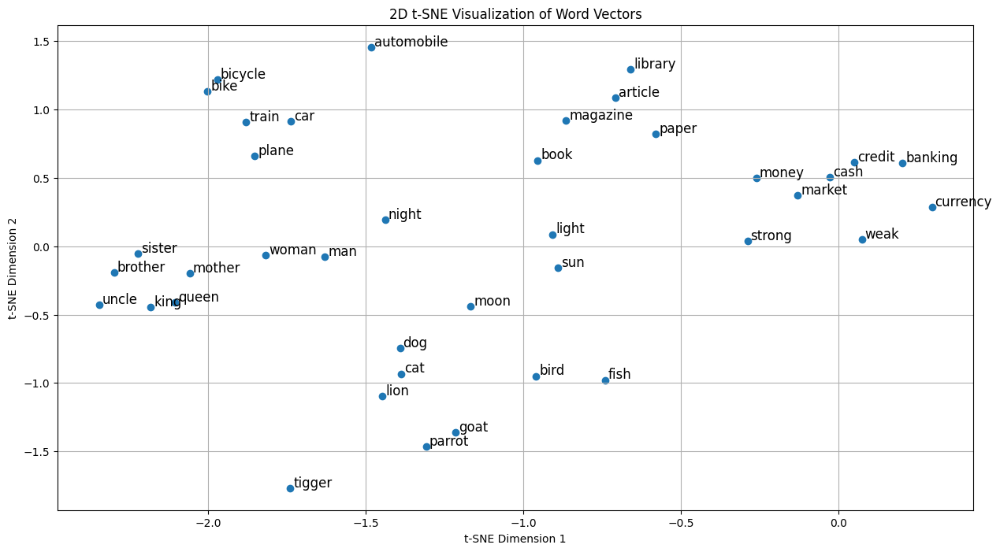

In [ ]:
# Vizualisation in 2D
import matplotlib.pyplot as plt
import pandas as pd
# Create a  DataFrame to facilitate the vizualisation
df_tsne = pd.DataFrame(Y, columns=['x', 'y'])
df_tsne['word'] = words

# Vizualise the results
plt.figure(figsize=(15, 8))
plt.scatter(df_tsne['x'], df_tsne['y'], marker='o')

# Annotate each point with its corresponding word
for i, word in enumerate(df_tsne['word']):
    plt.text(df_tsne['x'][i] + 0.01, df_tsne['y'][i] + 0.01, word, fontsize=12)

plt.title("2D t-SNE Visualization of Word Vectors")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.grid(True)
plt.show()

The previous vizualisation provides an insight that the Glove embedding of word in the sentence preserve, in some sense, the meaning of the word, since similar words such as **sister, brother, uncle, mother, queen, king** or **bike, bicycle, train, plane, car** have similar representation.

### Data preprocessing
We will use the `preprocess_dataset` function below to process the dataset and obtain the following three variables:
* `X`: a sequence of **embeddings** of the tokens of sentences.
* `index`: the index of the **token to classify**.
* `y`: the **true class label** of that token.

In [ ]:
def preprocess_dataset(dataset):
    """Preprocess a dataset.

    Parameters
    ----------
    dataset : Conll
        Dataset.

    Returns
    -------
    X : list[Tensors]
        Preprocessed sentences.

    y : Tensor
        Preprocessed labels.

    index : Tensor
        Indices of the tokens to predict.

    """

    X = []
    y = []
    index = []
    mapping = []

    label_mapping = {'NON-VERB': 0, 'VERB': 1}

    for count, sentence in enumerate(dataset):

        embedded_sentence = []
        label = None
        idx = None

        for i, token in enumerate(sentence):

            # Get the token in lower cases
            token_lower = token.form.lower()

            # Get the embedding of the token
            if token_lower in embeddings.keys():
                embedded_sentence.append(embeddings[token_lower].reshape(1, -1))
            else:
                embedded_sentence.append(embeddings['out_of_vocabulary'].reshape(1, -1))

            # Get the label (if any)
            if len(token.feats):
                if label is not None:
                    raise ValueError("Two annotated tokens in a single sentence.")
                label = label_mapping[next(iter(token.feats['POS']))]
                idx = i

        # Add the preprocessed sample to the dataset only if there is a label available
        if label is not None:
            X.append(torch.concat(embedded_sentence))
            y.append(label)
            index.append(idx)
            mapping.append(count)

    y = torch.tensor(y).to(dtype=torch.float32)
    index = torch.tensor(index).to(dtype=torch.int64)

    return X, index, y,mapping

We can just run it on the three datasets (training set, validation set and test set).

In [ ]:
X_train, index_train, y_train, mapping_train = preprocess_dataset(train)
X_val, index_val, y_val, mapping_val = preprocess_dataset(validation)
X_test, index_test, y_test, mapping_test = preprocess_dataset(test)

#### Models architectures and performance loop

Here we consider the simplest architecture given as follow:

* First layer: Bidirectional GRU with 100 hidden features.
* Second layer: Linear with 1 output feature.

Our goal is to challenge this to Model 2 having a relu activation:



##### Architectures

This syntax of this architecture is inspired of the altlier architecture.

In [ ]:
from torch import nn
from torch.nn.utils.rnn import pad_sequence, pack_padded_sequence, pad_packed_sequence


class GRUNetwork1(nn.Module):
    def __init__(self, dim_word, n_hidden=100):
        super().__init__()
        self.gru = nn.GRU(dim_word, n_hidden, bidirectional=True)
        self.linear = nn.Linear(2 * n_hidden, 1)


    def forward(self, X, index):
        """Forward method.

        Parameters
        ----------
        X : list[Tensors], len = batch_size
            Sequence of embeddings.

        index : tensor, shape = (batch_size,)
            Index of the token of interest in each sequence.

        Returns
        -------
        y : tensor, shape = (batch_size,)
            Logits.

        """
        # Get the length of each sequence
        lens = [sequence.size()[0] for sequence in X]

        # Pad the list of tensors
        X_padded = pad_sequence(X)

        # Pack the padded sequence
        X_packed = pack_padded_sequence(X_padded, lens, enforce_sorted=False)

        # Apply the GRU
        output_packed, _ = self.gru(X_packed)

        # Unpack the output of the GRU
        output_unpacked, _ = pad_packed_sequence(output_packed)

        # Get the hidden state for the token of interest
        h = torch.concat([output_unpacked[idx, i].reshape(1, -1) for i, idx in enumerate(index)])

        # Apply the linear layer
        y = torch.squeeze(self.linear(h))

        return y

In [ ]:
class GRUNetwork2(nn.Module):
    def __init__(self, dim_word, n_hidden=100):
        super().__init__()
        self.gru = nn.GRU(dim_word, n_hidden, bidirectional=True)
        self.linear = nn.Linear(2 * n_hidden, 1)
        self.relu = nn.ReLU()


    def forward(self, X, index):
        """Forward method.

        Parameters
        ----------
        X : list[Tensors], len = batch_size
            Sequence of embeddings.

        index : tensor, shape = (batch_size,)
            Index of the token of interest in each sequence.

        Returns
        -------
        y : tensor, shape = (batch_size,)
            Logits.

        """
        # Get the length of each sequence
        lens = [sequence.size()[0] for sequence in X]

        # Pad the list of tensors
        X_padded = pad_sequence(X)

        # Pack the padded sequence
        X_packed = pack_padded_sequence(X_padded, lens, enforce_sorted=False)

        # Apply the GRU
        output_packed, _ = self.gru(X_packed)

        # Unpack the output of the GRU
        output_unpacked, _ = pad_packed_sequence(output_packed)

        # Get the hidden state for the token of interest
        h = torch.concat([output_unpacked[idx, i].reshape(1, -1) for i, idx in enumerate(index)])

        # Apply the linear layer
        y = torch.squeeze(self.linear(h))

        return y

In [ ]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

print(f"Using {device} device")

Using cpu device


##### Performance loop

The following code inspired by the atelier class is designed to run and print out the performance of a given model.

In [ ]:
import matplotlib.pyplot as plt
import torch
from torch import nn

# Define a reusable function for training a single model and collecting metrics
def train_and_evaluate_model(model, dataloaders, loss_fn, optimizer, epochs, device, model_name="Model"):
    """
    Train and evaluate a model, and collect metrics for plotting.

    Parameters:
    - model: The PyTorch model to train.
    - dataloaders: A dictionary containing 'train', 'val', and 'test' dataloaders
    - loss_fn: Loss function
    - optimizer: Optimizer
    - epochs: Number of epochs to train
    - device: Device to use (CPU/GPU)
    - model_name: Name of the model (for logging purposes)

    Returns:
    - metrics: A dictionary containing loss and accuracy history for training and validation.
    """
    dataloader_train = dataloaders['train']
    dataloader_val = dataloaders['val']

    # Store metrics
    metrics = {
        "train_loss": [],
        "train_accuracy": [],
        "val_loss": [],
        "val_accuracy": [],
    }

    print(f"Training {model_name}...\n")

    for t in range(epochs):
       # print(f"Epoch {t + 1}\n-------------------------------------------------")

        # Train loop
        train_loop(dataloader_train, model, loss_fn, optimizer, device)

        # Evaluation loop for training data
        loss_train, accuracy_train = eval_loop(dataloader_train, model, loss_fn, device)
        metrics["train_loss"].append(loss_train)
        metrics["train_accuracy"].append(accuracy_train)

        # Evaluation loop for validation data
        loss_val, accuracy_val = eval_loop(dataloader_val, model, loss_fn, device)
        metrics["val_loss"].append(loss_val)
        metrics["val_accuracy"].append(accuracy_val)

        #print(f"Training set:   Accuracy: {(100 * accuracy_train): >0.1f}%, Avg loss: {loss_train: >8f}")
        #print(f"Validation set: Accuracy: {(100 * accuracy_val): >0.1f}%, Avg loss: {loss_val: >8f}\n")

    print(f"Training for {model_name} complete!")

    return metrics

# Plotting
def plot_metrics(metrics, metric_name, title, ylabel):
    """
    Plot metrics (accuracy or loss) for all models.

    Parameters:
    - metrics: Dictionary containing metrics for all models.
    - metric_name: Key for the metric to plot ('train_accuracy', 'val_loss').
    - title: Title of the plot.
    - ylabel: Label for the y-axis.
    """
    plt.figure(figsize=(10, 6))
    for model_name, model_metrics in metrics.items():
        plt.plot(model_metrics[metric_name], label=model_name)
    plt.title(title)
    plt.xlabel("Epoch")
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid()
    plt.show()


#### Training model

Training GRU_Model1...

Training for GRU_Model1 complete!
Training GRU_Model2...

Training for GRU_Model2 complete!


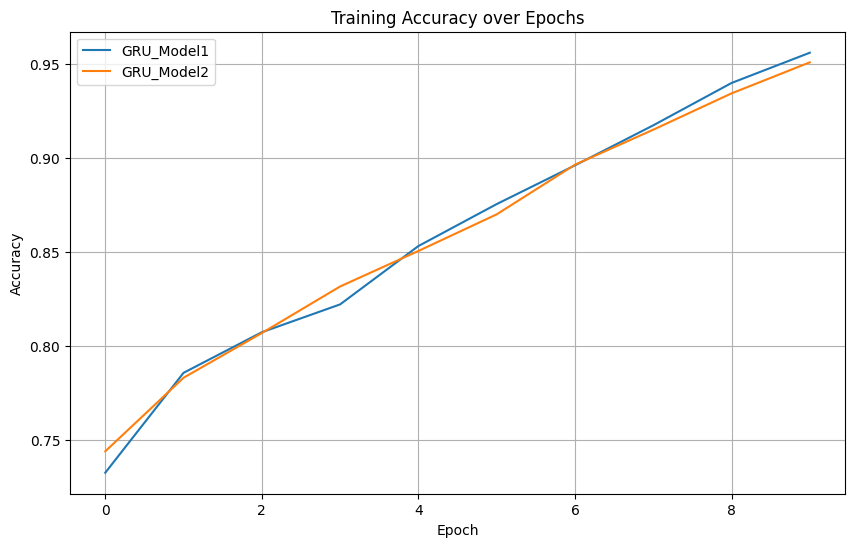

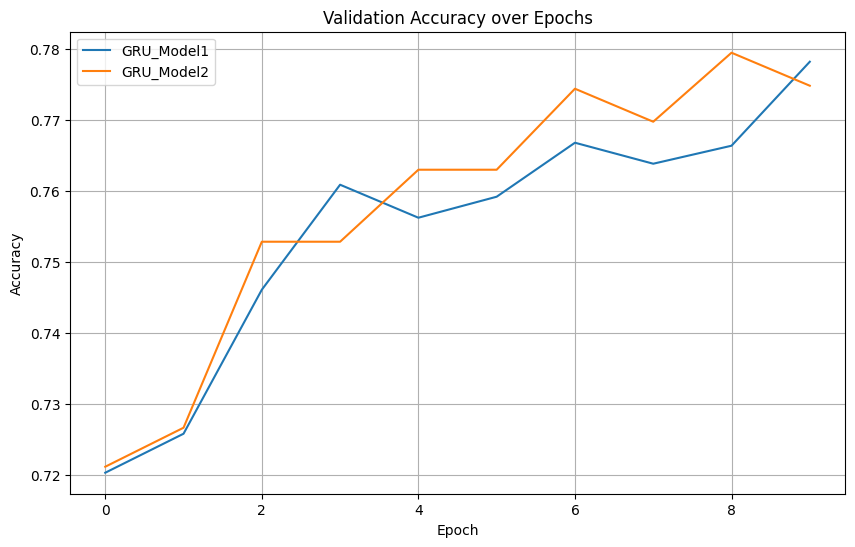

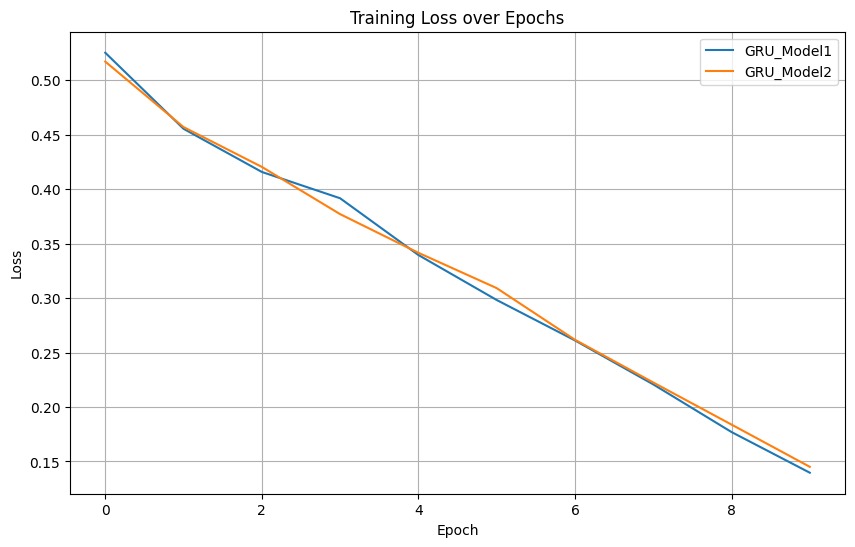

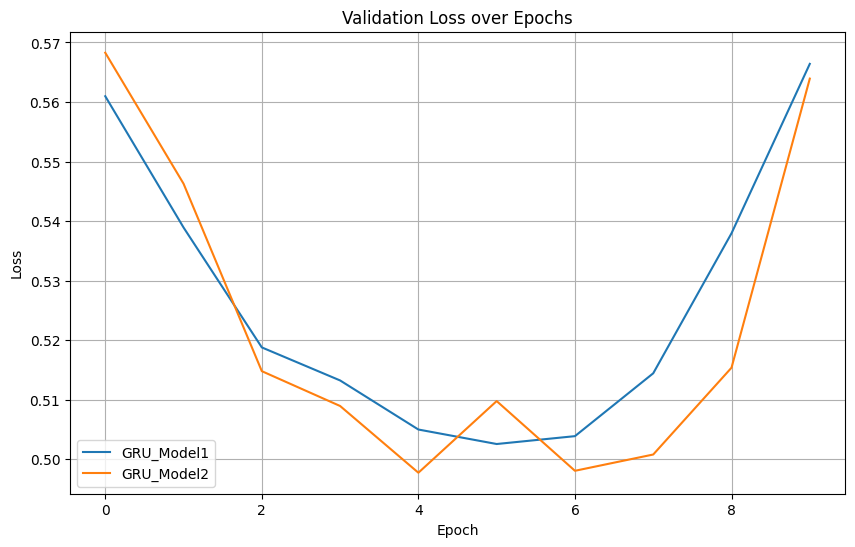

In [ ]:
# Models to train
models = {
    "GRU_Model1": GRUNetwork1(dim_word=50).to(device),
    "GRU_Model2": GRUNetwork2(dim_word=50).to(device),
}

# Define the dataloaders
dataloaders = {
    "train": dataloader_train,
    "val": dataloader_val,
    "test": dataloader_test,
}

# Define common parameters
loss_fn = nn.BCEWithLogitsLoss()
epochs = 10
all_metrics = {}


# Train and evaluate all models
for model_name, model in models.items():
    optimizer = torch.optim.Adam(model.parameters())  # Create a new optimizer for each model
    metrics = train_and_evaluate_model(model, dataloaders, loss_fn, optimizer, epochs, device, model_name)
    all_metrics[model_name] = metrics


# Plot accuracies and losses
plot_metrics(all_metrics, "train_accuracy", "Training Accuracy over Epochs", "Accuracy")
plot_metrics(all_metrics, "val_accuracy", "Validation Accuracy over Epochs", "Accuracy")
plot_metrics(all_metrics, "train_loss", "Training Loss over Epochs", "Loss")
plot_metrics(all_metrics, "val_loss", "Validation Loss over Epochs", "Loss")

In [ ]:
model1 = GRUNetwork1(dim_word=50).to(device)
loss_fn = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model1.parameters())
epochs = 10

for t in range(epochs):
    print(f"Epoch {t + 1}\n-------------------------------------------------")

    # Train loop
    train_loop(dataloader_train, model1, loss_fn, optimizer, device)

    # Evaluation loop
    loss_train_model1, accuracy_train_model1 = eval_loop(dataloader_train, model1, loss_fn, device)
    print(f"Training set:   Accuracy: {(100 * accuracy_train_model1): >0.1f}%, Avg loss: {loss_train_model1: >8f}")

    loss_val_model1, accuracy_val_model1 = eval_loop(dataloader_val, model1, loss_fn, device)
    print(f"Validation set: Accuracy: {(100 * accuracy_val_model1): >0.1f}%, Avg loss: {loss_val_model1: >8f}\n")

print("Done!")

loss_test_model1, accuracy_test_model1 = eval_loop(dataloader_test, model1, loss_fn, device)
print(f"Validation set: Accuracy: {(100 * accuracy_test_model1): >0.1f}%, Avg loss: {loss_test_model1: >8f}\n")

loss_test_model1, accuracy_test_model1 = eval_loop(dataloader_test, model1, loss_fn, device)
print(f"Validation set: Accuracy: {(100 * accuracy_test_model1): >0.1f}%, Avg loss: {loss_test_model1: >8f}\n")

In [ ]:
for t in range(epochs):
    print(f"Epoch {t + 1}\n-------------------------------------------------")

    # Train loop
    train_loop(dataloader_train, model1, loss_fn, optimizer, device)

    # Evaluation loop
    loss_train_model1, accuracy_train_model1 = eval_loop(dataloader_train, model1, loss_fn, device)
    print(f"Training set:   Accuracy: {(100 * accuracy_train_model1): >0.1f}%, Avg loss: {loss_train_model1: >8f}")

    loss_val_model1, accuracy_val_model1 = eval_loop(dataloader_val, model1, loss_fn, device)
    print(f"Validation set: Accuracy: {(100 * accuracy_val_model1): >0.1f}%, Avg loss: {loss_val_model1: >8f}\n")

print("Done!")

In [ ]:
loss_test_model1, accuracy_test_model1 = eval_loop(dataloader_test, model1, loss_fn, device)
print(f"Validation set: Accuracy: {(100 * accuracy_test_model1): >0.1f}%, Avg loss: {loss_test_model1: >8f}\n")

In [ ]:
loss_test_model1, accuracy_test_model1 = eval_loop(dataloader_test, model1, loss_fn, device)
print(f"Validation set: Accuracy: {(100 * accuracy_test_model1): >0.1f}%, Avg loss: {loss_test_model1: >8f}\n")

### Bidirectional Gated Recurrent Unit

Since, the objective of our model is to classify specific word in a given sentence as Noun or Verb, and the label (Noun/Verb) of the word is not determined solely by the word in question, but the context in which it appears, we want our model to take into account, not only the word to classify, but also the sequence of words that precede and follow the word of interest.

The **Gated Recurrent Unit (GRU)** which is a recurrent layer, enable us to take into account this sequential order (or the recurrence) of the sentence. For each token (or word) $x^{(t)}$ in the sentence :
- the GRU encodes a hidden state $ h^{(t)}$ which is a (contextual) representation of sentence up to the token $x^{(t)}$.
- This hidden state $ h^{(t)}$ is a combination of the token $x^{(t)}$ and its context (the representation of the sentence at step $t-1$ : $ h^{(t-1)}$ )

In addition to take into account the context of the sentence **before** the token to classify, we will also take the context of the sentence **after** the token, this defines a bidirectional recurrent layer, which can be represented as follows :
* Before the token (*forward* direction) : $ x^{(0)} \longrightarrow x^{(1)} \longrightarrow \ldots \longrightarrow x^{(t-1)} \longrightarrow x^{(t)} $
* After the token (*backward* direction) : $ x^{(t)} \longleftarrow x^{(t+1)} \longleftarrow \ldots \longleftarrow x^{(T-1)} \longleftarrow x^{(T)} $


The image below summarizes the architecture of the bidirectional gated recurrent unit.

<img src="https://d2l.ai/_images/birnn.svg" width="350"/>




Finally, since, different sentences in our dataset may have different lengths (inconvenient to process them with Pytorch), we use the fonction `pad_sequence` to pad sentences (by adding sequences of zero at the end of smaller sentences so that all sentences will have the same length), `pack_padded_sequence`, to ignore the padded value during the processing, and `pad_packed_sequence` to unpack the padded sentences at the end.

We implement the architecture of neural network with bidirectional GRU, described above as follows:

* First layer: Bidirectional GRU with 100 hidden features.
* Second layer: Linear with 1 output feature (since we have a two classes).

In [ ]:
from torch import nn
from torch.nn.utils.rnn import pad_sequence, pack_padded_sequence, pad_packed_sequence


class GRUNetwork(nn.Module):
    def __init__(self, dim_word, n_hidden=100):
        super().__init__()
        self.gru = nn.GRU(dim_word, n_hidden, bidirectional=True)
        self.linear = nn.Linear(2 * n_hidden, 1)


    def forward(self, X, index):
        """Forward method.

        Parameters
        ----------
        X : list[Tensors], len = batch_size
            Sequence of embeddings.

        index : tensor, shape = (batch_size,)
            Index of the token of interest in each sequence.

        Returns
        -------
        y : tensor, shape = (batch_size,)
            Logits.

        """
        # Get the length of each sequence
        lens = [sequence.size()[0] for sequence in X]

        # Pad the list of tensors
        X_padded = pad_sequence(X)

        # Pack the padded sequence
        X_packed = pack_padded_sequence(X_padded, lens, enforce_sorted=False)

        # Apply the GRU
        output_packed, _ = self.gru(X_packed)

        # Unpack the output of the GRU
        output_unpacked, _ = pad_packed_sequence(output_packed)

        # Get the hidden state for the token of interest
        h = torch.concat([output_unpacked[idx, i].reshape(1, -1) for i, idx in enumerate(index)])

        # Apply the linear layer
        y = torch.squeeze(self.linear(h))

        return y

#### Dataloaders

* Create your `CustomDataset` class, then create your instances of `DataLoader`. Pay attention to the `collate_fn` hyperparameter.

Next, we create a DataLoader to iteratively load a mini-batch of our training, evaluation and test sets during each epoch cycle. The parameter `suffle = True` allows us to randomly combine different samples into a mini-batch at each epoch.

In [ ]:
from torch.utils.data import Dataset, DataLoader


class CustomDataset(Dataset):
    def __init__(self, X, y, index):
        self.X = X
        self.y = y
        self.index = index

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.index[idx]


dataloader_train = DataLoader(
    CustomDataset(X_train, y_train, index_train),
    batch_size=64, shuffle=True, collate_fn=lambda x: x
)

dataloader_val = DataLoader(
    CustomDataset(X_val, y_val, index_val),
    batch_size=64, shuffle=True, collate_fn=lambda x: x
)

dataloader_test = DataLoader(
    CustomDataset(X_test, y_test, index_test),
    batch_size=64, shuffle=True, collate_fn=lambda x: x
)

#### Training

Let's write the `train_loop` and `eval_loop` functions to train and evaluate the model.


In [ ]:
def train_loop(dataloader, model, loss_fn, optimizer, device):

    model.train()

    for batch in dataloader:

        # Reset gradients
        optimizer.zero_grad()

        X = [item[0].to(device) for item in batch]
        y = torch.tensor([item[1] for item in batch]).to(device)
        index = torch.tensor([item[2] for item in batch]).to(device)

        # Forward
        pred = model(X, index)
        if isinstance(pred, tuple):
            pred = pred[0]
        loss = loss_fn(pred, y)

        # Backpropagation
        loss.backward()
        optimizer.step()


def eval_loop(dataloader, model, loss_fn, device):

    model.eval()
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    loss, correct = 0., 0.

    with torch.no_grad():
        for batch in dataloader:

            X = [item[0].to(device) for item in batch]
            y = torch.tensor([item[1] for item in batch]).to(device)
            index = torch.tensor([item[2] for item in batch]).to(device)

            pred = model(X, index)
            if isinstance(pred, tuple):
                pred = pred[0]
            loss += loss_fn(pred, y).item()
            correct += ((pred > 0) == y).type(torch.float).sum().item()

    loss /= num_batches
    correct /= size
    return loss, correct

In [ ]:
# Put our model of GPU
device = (
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

# Note: we don't recommend using the "mps" device for this notebook.

print(f"Using {device} device")

Using cpu device


We train our model with the BCEWithLogitsLoss (a Binary Cross Entropy Loss combined with a softmax layer), the Adam optimizer on 10 epochs.

In [ ]:
model1 = GRUNetwork(dim_word=50).to(device)
loss_fn = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model1.parameters())
epochs = 10

Let's define a function to print the performance of the model at each epoch

In [ ]:
def train_eval_performance(model):
    """
    Train and evaluate a model, and collect metrics for plotting.

    Parameters:
    - model: The PyTorch model to train.

    Returns:
    - metrics: A dictionary containing loss and accuracy history for training and validation.
    """
  # Store metrics at each epoch
  metrics = {
      'losses_train' : [],
      'accuracies_train' : [],
      'losses_val' : [],
      'accuracies_val' : []
    }

  for t in range(epochs):
      print(f"Epoch {t + 1}\n-------------------------------------------------")

      # Train loop
      train_loop(dataloader_train, model, loss_fn, optimizer, device)

      # Evaluation loop
      loss_train, accuracy_train = eval_loop(dataloader_train, model, loss_fn, device)
      print(f"Training set:   Accuracy: {(100 * accuracy_train): >0.1f}%, Avg loss: {loss_train: >8f}")

      loss_val, accuracy_val = eval_loop(dataloader_val, model, loss_fn, device)
      print(f"Validation set: Accuracy: {(100 * accuracy_val): >0.1f}%, Avg loss: {loss_val: >8f}\n")

      # Store the loss and accuracy at each epoch
      metrics["losses_train"].append(loss_train)
      metrics["accuracies_train"].append(accuracy_train)

      metrics["losses_val"].append(loss_val)
      metrics["accuracies_val"].append(accuracy_val)

  print("Done!")

  return metrics

In [ ]:
metrics_model1 = train_eval_performance(model1)

Epoch 1
-------------------------------------------------
Training set:   Accuracy: 76.0%, Avg loss: 0.495439
Validation set: Accuracy: 71.4%, Avg loss: 0.563235

Epoch 2
-------------------------------------------------
Training set:   Accuracy: 78.9%, Avg loss: 0.457688
Validation set: Accuracy: 73.6%, Avg loss: 0.539176

Epoch 3
-------------------------------------------------
Training set:   Accuracy: 80.4%, Avg loss: 0.420901
Validation set: Accuracy: 73.1%, Avg loss: 0.537784

Epoch 4
-------------------------------------------------
Training set:   Accuracy: 83.2%, Avg loss: 0.375878
Validation set: Accuracy: 74.4%, Avg loss: 0.510840

Epoch 5
-------------------------------------------------
Training set:   Accuracy: 85.2%, Avg loss: 0.336664
Validation set: Accuracy: 76.7%, Avg loss: 0.497459

Epoch 6
-------------------------------------------------
Training set:   Accuracy: 87.0%, Avg loss: 0.302715
Validation set: Accuracy: 78.0%, Avg loss: 0.491756

Epoch 7
--------------

Let's plot the evolution of the performance of the model [3]

[3] This code is based on a first example provided by ChatGPT, which has been adjusted and improved.

In [ ]:
def plot_performance(metrics):
  # Create a figure with 2 subplots (side by side)
  fig, ax = plt.subplots(1, 2, figsize=(13, 5))

  # Plot Loss (left plot)
  ax[0].plot(range(epochs), metrics["losses_train"], label='Train Loss', color='blue', marker='o',linewidth = 1)
  ax[0].plot(range(epochs), metrics["losses_val"], label='Validation Loss', color='red', marker='D',linewidth = 1)
  ax[0].set_title('Loss per Epoch')
  ax[0].set_xlabel('Epochs')
  ax[0].set_ylabel('Loss')
  ax[0].legend()
  ax[0].grid(True)

  # Plot Accuracy (right plot)
  ax[1].plot(range(epochs), metrics["accuracies_train"], label='Train Accuracy', color='blue', marker='o',linewidth = 1)
  ax[1].plot(range(epochs), metrics["accuracies_val"], label='Validation Accuracy', color='red', marker='D',linewidth = 1)
  ax[1].set_title('Accuracy per Epoch')
  ax[1].set_xlabel('Epochs')
  ax[1].set_ylabel('Accuracy')
  ax[1].legend()
  ax[1].grid(True)

  # Adjust layout for better spacing between plots
  plt.tight_layout()

  # Show the plot
  plt.show()

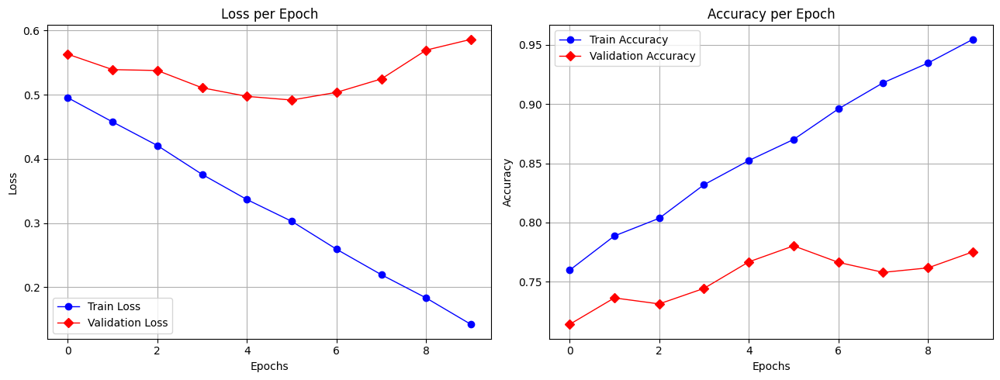

In [ ]:
# Plot performance of bidirectional GRU
plot_performance(metrics_model1)

Across the epochs, although the loss doesn't seem to be improving on the evaluation set, the accuracy does seem to be improving (going from 0.70 to 0.80, in other words, an increase of approximately 10 percentage points).


Perfomance of the bidirectional GRU on the test set :

In [ ]:
loss_test_model1, accuracy_test_model1 = eval_loop(dataloader_test, model1, loss_fn, device)
print(f"Validation set: Accuracy: {(100 * accuracy_test_model1): >0.1f}%, Avg loss: {loss_test_model1: >8f}\n")

Validation set: Accuracy: 78.6%, Avg loss: 0.549501



### Attention Mechanism

Another important feature of recurrent layer, which is used as second model in this exercise, is **Attention Mechanism**. Indeed, when determining whether a token is Noun or verb, the emphasis is only put on some tokens in sentences : Only some tokens in sentence are relevant to determine if a word is Noun or Verb.

The figure below provides an example of attention mechanism.

![Illustration from https://www.tensorflow.org](https://www.tensorflow.org/images/tutorials/transformer/encoder_self_attention_distribution.png)

To enable, our previous bidirectional GRU model, to put more weights on some token that are relevant than others, we add a MultiHeadAttention mechanism to our neural network.

The architecture of our secon neural network is then :


* First layer: Bidirectional GRU with 100 hidden features.
* Second layer : MultiHeadAttention mechanism.
* Third layer: Linear with 1 output feature.




In [ ]:
from torch import nn
from torch.nn.utils.rnn import pad_sequence, pack_padded_sequence, pad_packed_sequence


class AttentionGRUNetwork(nn.Module):
    def __init__(self, hidden_size_gru=100, num_heads=1):
        super().__init__()
        self.gru = nn.GRU(50, hidden_size_gru,bidirectional=True)
        self.attention = nn.MultiheadAttention(embed_dim=2*hidden_size_gru, num_heads=num_heads)
        self.linear = nn.Linear(2*hidden_size_gru, 1)

    def forward(self, X, index):
        """Forward method.

        Parameters
        ----------
        X : list[Tensor], len = batch_size
            Sequence of embeddings.

        index : tensor, shape = (batch_size,)
            Index of the token of interest in each sequence.

        Returns
        -------
        y : Tensor, shape = (batch_size,)
            Logits.

        attn_weights : list[Tensor], len = batch_size
            List of attention weights for each token of interest

        """
        # Get the length of each sequence
        lens = [sequence.size()[0] for sequence in X]
        max_len = max(lens)

        # Pad the list of tensors
        X_padded = pad_sequence(X)

        # Pack the padded sequence
        X_packed = pack_padded_sequence(X_padded, lens, enforce_sorted=False)

        # Apply the GRU
        gru_output, _ = self.gru(X_packed)

        # Unpack the output of the GRU
        gru_output, _ = pad_packed_sequence(gru_output)

        # Generate the padding masks (True if padded, False otherwise)
        key_padding_mask = torch.vstack([
            torch.concat((torch.full((length,), False), torch.full((max_len - length,), True)))
            for length in lens
        ])

        # Compute self attention
        attn_output, attn_output_weights = self.attention(
            gru_output, gru_output, gru_output, key_padding_mask=key_padding_mask
        )

        # Get the attention output for the tokens of interest only
        h = torch.vstack([attn_output[idx, i] for i, idx in enumerate(index)])

        # Get the attention weights for the tokens of interest only
        attn_weights = [
            attn_output_weights[i, idx, :length] for i, (idx, length) in enumerate(zip(index, lens))
        ]

        # Apply the linear layer
        y = torch.squeeze(self.linear(h))

        return y, attn_weights

We also used the BCEWithLogitsLoss on 10 epochs

In [ ]:
model2 = AttentionGRUNetwork()
optimizer = torch.optim.Adam(model2.parameters())
loss_fn = nn.BCEWithLogitsLoss()
epochs = 10
device = 'cpu'

In [ ]:
# Performance Bidirectional GRU + Attention mechanism
metrics_model2 = train_eval_performance(model2)

Epoch 1
-------------------------------------------------
Training set:   Accuracy: 75.3%, Avg loss: 0.502856
Validation set: Accuracy: 70.7%, Avg loss: 0.572034

Epoch 2
-------------------------------------------------
Training set:   Accuracy: 78.2%, Avg loss: 0.472339
Validation set: Accuracy: 71.2%, Avg loss: 0.565164

Epoch 3
-------------------------------------------------
Training set:   Accuracy: 80.7%, Avg loss: 0.424506
Validation set: Accuracy: 72.5%, Avg loss: 0.544010

Epoch 4
-------------------------------------------------
Training set:   Accuracy: 83.3%, Avg loss: 0.368244
Validation set: Accuracy: 75.2%, Avg loss: 0.529438

Epoch 5
-------------------------------------------------
Training set:   Accuracy: 85.5%, Avg loss: 0.328176
Validation set: Accuracy: 75.5%, Avg loss: 0.535915

Epoch 6
-------------------------------------------------
Training set:   Accuracy: 87.7%, Avg loss: 0.295991
Validation set: Accuracy: 76.6%, Avg loss: 0.520658

Epoch 7
--------------

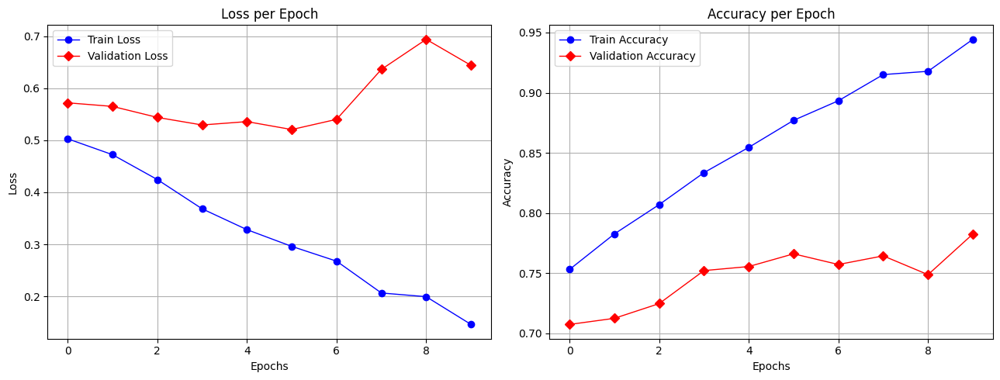

In [ ]:
# Plot the performance of the bidirectional GRU + Attention mechanism
plot_performance(metrics_model2)

Througout epochs, we also an improvement of the accuracy on the evaluation set, but the loss seems increasing (a little bit).

#### Weights vizualisation

Let's vizualise the attention weights given to tokens of a given sentence. Given that, the attention weights is computed to the sequence of hidden vectors and not to the sequence of input vectors (tokens), the correct interpretation of the attention weights is the weight given to the contextual representation of the token. However, we may approximately interpret the attention weights as the weights of input tokens.

In [ ]:
import matplotlib.pyplot as plt


def plot_attention_weights(dataset, idx):
    """Plot a sample from a given dataset and a given index, as well
    as the attention weights learned by the model.

    Parameters
    ----------
    dataset : {'train', 'validation', 'test'}
        Dataset.

    idx : int
        Index of the sample.

    """

    if dataset == 'train':
        dataset = train
        X = X_train
        y = y_train
        index = index_train
        mapping = mapping_train
    elif dataset == 'validation':
        dataset = validation
        X = X_val
        y = y_val
        index = index_val
        mapping = mapping_val
    elif dataset == 'test':
        dataset = test
        X = X_test
        y = y_test
        index = index_test
        mapping = mapping_test

    # Get original labels
    label_inverse_mapping = {False: 'NOUN', True: 'VERB'}

    # Compute prediction and attention weights
    pred, attn = model2(X[idx:idx+1], index[idx:idx+1])
    y_pred = label_inverse_mapping[pred.item() > 0]

    # Plot the results
    plt.figure(figsize=(14, 2))
    plt.imshow(attn[0].detach().numpy().reshape(1, -1), cmap='seismic', vmin=0., vmax=1.)
    plt.xticks(-0.5 + np.arange(0, len(X[idx])), [])
    plt.yticks([])
    plt.tick_params(length=0)

    for i, token in enumerate(dataset[mapping[idx]]):
        if i == index[idx:idx+1]:
            color = 'C0'
            fontweight = 'bold'
        else:
            color = 'k'
            fontweight = 'normal'
        plt.text(i, -0.6, token.form, color=color, rotation=45, fontweight=fontweight, ha='left')

    plt.grid(which='major', color='C2', linestyle='--', linewidth=2)

    colorbar = plt.colorbar(orientation='horizontal')
    colorbar.set_ticks(np.linspace(0, 1, 6))
    colorbar.set_ticklabels([f'{tick: >.1f}' for tick in np.linspace(0, 1, 6)])

    print(f"True label: {label_inverse_mapping[y[idx].item() == 1]}")
    print(f"Predicted label: {label_inverse_mapping[pred.item() > 0]}")

True label: VERB
Predicted label: VERB


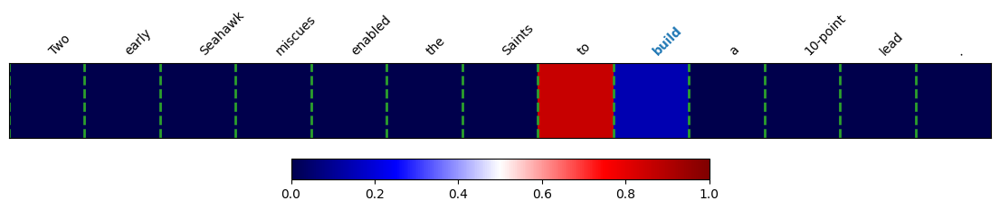

In [ ]:
plot_attention_weights('train', 1)

In this example, we observe the attention mechanism seems working, since more weighths are put on **to**, but also on the word itself **build** to classify it as a Verb

True label: VERB
Predicted label: VERB


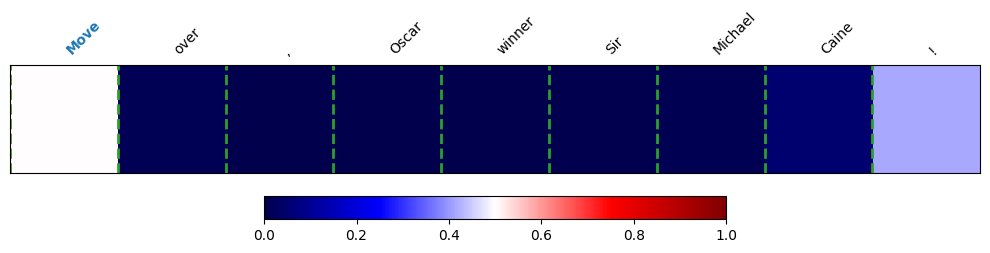

In [ ]:
plot_attention_weights('train', 12)

In this example also, **Move** (per se.) and **"!"** (indicating an imperative sentence) are important information for the classification.

True label: VERB
Predicted label: VERB


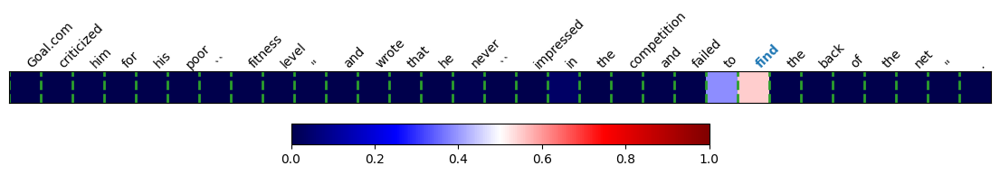

In [ ]:
plot_attention_weights('train', 2023)

True label: NOUN
Predicted label: NOUN


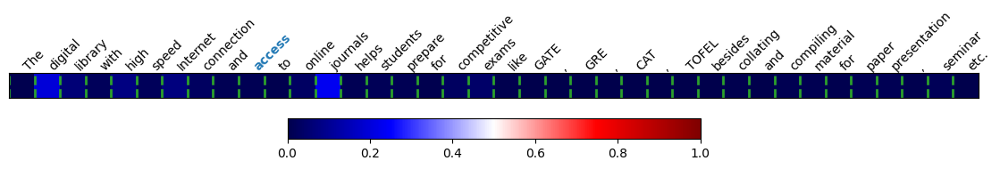

In [ ]:
plot_attention_weights('train', 1346)

In the example above, **journals** are important to classify the word **access** as "Noun". In this case, the word (per se.) doesn't give us a relevant information, since access could also be a verb.

In [ ]:
loss_test_model2, accuracy_test_model2 = eval_loop(dataloader_test, model2, loss_fn, device)
print(f"Validation set: Accuracy: {(100 * accuracy_test_model2): >0.1f}%, Avg loss: {loss_test_model2: >8f}\n")

Validation set: Accuracy: 78.9%, Avg loss: 0.605356



### Models Comparison
In principe, by adding a MultiHeadAttention mechanism to our bidirectional GRU, the performance must be improving, since we allow the model to focus (put more weights) on relevant information to classify word as Noun or Verb.

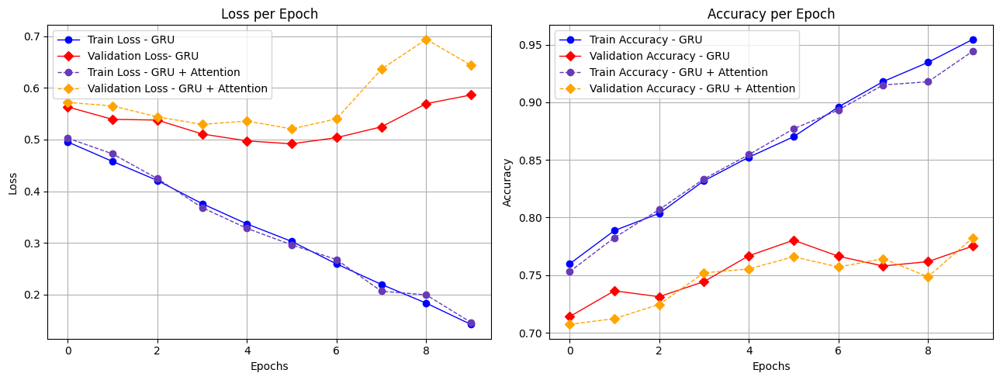

In [ ]:
# Create a figure with 2 subplots (side by side)
fig, ax = plt.subplots(1, 2, figsize=(13, 5))

# Plot Loss (left plot)
ax[0].plot(range(epochs), metrics_model1["losses_train"], label='Train Loss - GRU', color= 'blue', marker='o', linewidth=1)
ax[0].plot(range(epochs), metrics_model1["losses_val"], label='Validation Loss- GRU', color='red', marker='D', linewidth=1)
ax[0].plot(range(epochs), metrics_model2["losses_train"], label='Train Loss - GRU + Attention', color='#673ab7', marker='o', linestyle='--',linewidth=1)
ax[0].plot(range(epochs), metrics_model2["losses_val"], label='Validation Loss - GRU + Attention', color='orange', marker='D', linestyle='--',linewidth=1)
ax[0].set_title('Loss per Epoch')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()
ax[0].grid(True)

# Plot Accuracy (right plot)
ax[1].plot(range(epochs), metrics_model1["accuracies_train"], label='Train Accuracy - GRU', color='blue', marker='o',linewidth=1)
ax[1].plot(range(epochs), metrics_model1["accuracies_val"], label='Validation Accuracy - GRU', color='red', marker='D',linewidth=1)
ax[1].plot(range(epochs), metrics_model2["accuracies_train"], label='Train Accuracy - GRU + Attention', color='#673ab7', marker='o',linestyle='--',linewidth=1)
ax[1].plot(range(epochs), metrics_model2["accuracies_val"], label='Validation Accuracy - GRU + Attention', color='orange', marker='D',linestyle='--',linewidth=1)
ax[1].set_title('Accuracy per Epoch')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].legend()
ax[1].grid(True)

# Adjust layout for better spacing between plots
plt.tight_layout()

# Show the plot
plt.show()

By comparing the performance of our two model, it seems that the attention mechanism allows the model to perform better, but the gains are quite marginal, in our case. Both **bidirectional GRU** and **bidirectional GRU + Attention mechanism** have similar performance.

Besides the performance of both models, let's compare their confusion matrix [4]

[4] The code below is based on a first example provided by ChatGPT, that has been adjusted and improved.

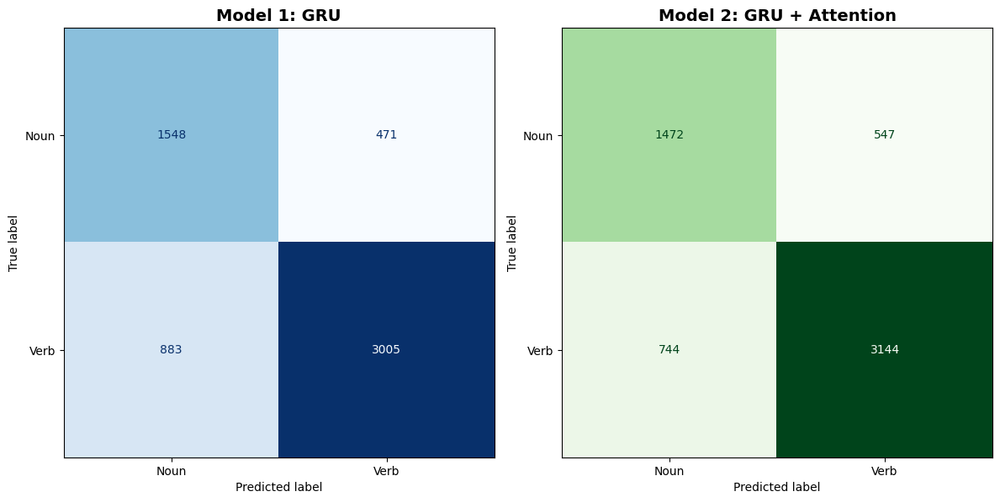

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Make predictions
pred_prob1 = model1(X_test,index_test)
y_pred1 = (pred_prob1 > 0.5).type(torch.float)  # Binary predictions

pred_prob2 = model2(X_test,index_test)
if isinstance(pred_prob2, tuple):
                pred_prob2 = pred_prob2[0] # Probabilities
y_pred2 = (pred_prob2 > 0.5).type(torch.float)  # Binary predictions

# Generate confusion matrix
cm1 = confusion_matrix(y_test, y_pred1)
cm2 = confusion_matrix(y_test, y_pred2)

# Plot side-by-side confusion matrices
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# First confusion matrix
disp1 = ConfusionMatrixDisplay(confusion_matrix=cm1, display_labels=['Noun', 'Verb'])
disp1.plot(cmap='Blues', ax=axes[0], colorbar=False)
axes[0].set_title("Model 1: GRU", fontsize=14, fontweight='bold')

# Second confusion matrix
disp2 = ConfusionMatrixDisplay(confusion_matrix=cm2, display_labels=['Noun', 'Verb'])
disp2.plot(cmap='Greens', ax=axes[1], colorbar=False)
axes[1].set_title("Model 2: GRU + Attention", fontsize=14, fontweight='bold')

# Adjust layout
plt.tight_layout()
plt.show()

The previous visualization allows us to compare the confusion matrix of the two models. Although by adding an attention mechanism to the bidirectional layer, the model was able to identify more “Verb” (which is over-represented in the test set), this improvement has one major drawback, huge number of Noun's misclassification.

Let's print example of misclassification by bidirectional GRU + Attention mechanism that were well classified by bidirectional GRU

In [ ]:
# Get the indexes of misclassifications for model1
misclassified_idx1 = (y_pred1 != y_test).nonzero(as_tuple=True)[0]

# Get the indexes of  misclassifications for model2
misclassified_idx2 = (y_pred2 != y_test).nonzero(as_tuple=True)[0]

# Get the difference in misclassifisations between model2 and model1
difference_idx = misclassified_idx2[~torch.isin(misclassified_idx2, misclassified_idx1)]

# Some indexes of sentences in the test set, that were well classified by bidirectional GRU, but wrongly by adding Attention mechanism
difference_idx[1:5]

tensor([29, 31, 37, 38])

True label: NOUN
Predicted label: VERB


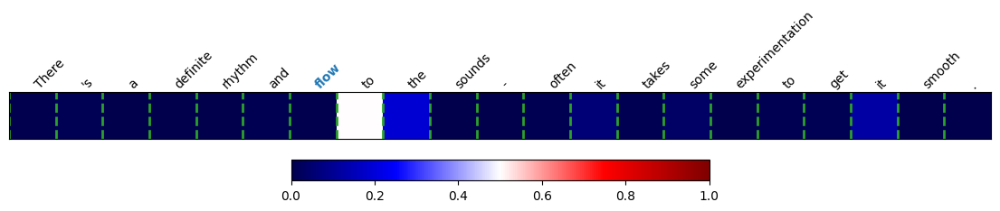

In [ ]:
plot_attention_weights('test',29)

In the example above of **Noun** that were well classified by bidirectional GRU, the bidirectional GRU + Attention mechanism misclassifies it as **Verb**, by wrongly put emphasis on **to**, although it should also that, in this case, **to** come after the word **flow**. It's also important to note that, since "*flow*" can be Verb or Noun, the model doesn't put emphasis on the token itself(flow) for classification.

True label: NOUN
Predicted label: VERB


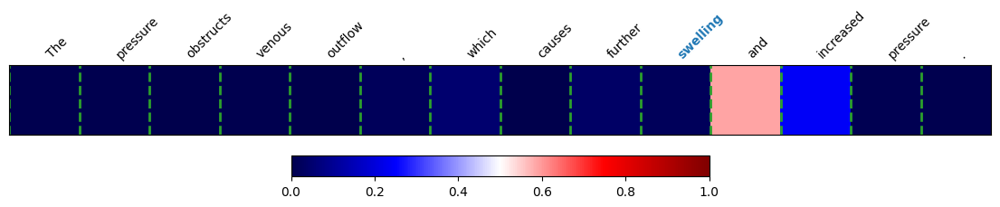

In [ ]:
plot_attention_weights('test',31)

True label: VERB
Predicted label: NOUN


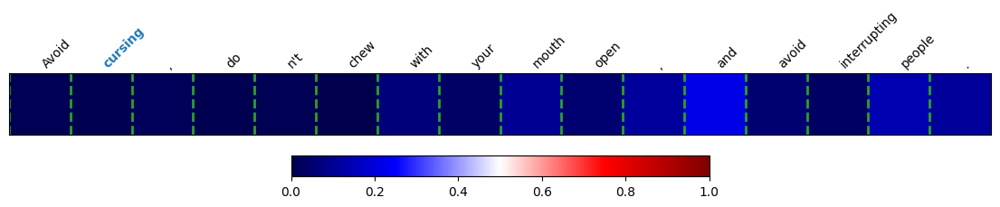

In [ ]:
plot_attention_weights('test',37)

In [ ]:
# Erase memory
del model1
del model2
del dataloader_train
del dataloader_val
del dataloader_test

## Question 2 (Food Image Classification)

By adapting the LeNet-5 [3], train a simple classifier for a resized version of the [Food-7 dataset](https://huggingface.co/datasets/cv-talks/food-7) dataset, which is a subset of the Food-101 dataset [2].

Execute the following five code cells to load the dataset.


**References**

[2] Bossard, Lukas; Guillaumin, Matthieu; Van Gool, Luc. Food-101 -- Mining Discriminative Components with Random Forests,
_European Conference on Computer Vision_, 2014.
URL: https://data.vision.ee.ethz.ch/cvl/datasets_extra/food-101/.


[3] Lecun, Yann; Bottou, Léon; Bengio, Yoshua; Haffner, Patrick. "Gradient-based learning applied to document recognition" (PDF). _Proceedings of the IEEE_. 86 (11): 2278–2324, 1998.

In [ ]:
!pip install datasets[vision]
!pip install gdown

In [ ]:
import os
import gdown
import zipfile
from datasets import load_from_disk


def download_food7(path='data/food'):
    filename = 'food7_34x34.zip'
    gdriveid = '1eZFfl8MUSN_WeovPkxR0_R7DS7TzQrxk'

    if not os.path.exists(path):
        os.makedirs(path)

    filepath = os.path.join(path, filename)
    if not os.path.isfile(filepath):
        gdown.download(id=gdriveid, output=filepath, quiet=False)


def load_food7(path='data/food'):
    filename = 'food7_34x34.zip'
    filepath = os.path.join(path, filename)
    with zipfile.ZipFile(filepath, 'r') as f:
        f.extractall(path)

    ds = load_from_disk(path)
    label_names = ds.features['label'].names
    class2name = {i: label_names[i] for i in range(len(label_names))}

    return ds, class2name


download_food7()
ds_food7, class2name = load_food7()

In [ ]:
# Split the dataset to train (size 6000) and test (size 1000) splits.

from torch.utils.data import random_split

train_size = 6000
test_size = 1000

ds_food7_split = ds_food7.train_test_split(
    train_size=train_size,
    test_size=test_size,
    stratify_by_column='label'
)

In [ ]:
# Prepare dataloaders.

import torch
from torch.utils.data import DataLoader
from torchvision.transforms import v2 as tvtf

def collate_fn1(minibatch):
    """ Transform each minibatch.
    """
    images = []
    labels = []
    for example in minibatch:
        images.append(example["image"])
        labels.append(example["label"])

    return torch.tensor(images), torch.tensor(labels)

dataloader_train = DataLoader(ds_food7_split['train'], collate_fn=collate_fn1, batch_size=32,shuffle=True)
dataloader_test = DataLoader(ds_food7_split['test'], collate_fn=collate_fn1, batch_size=128,shuffle = True)

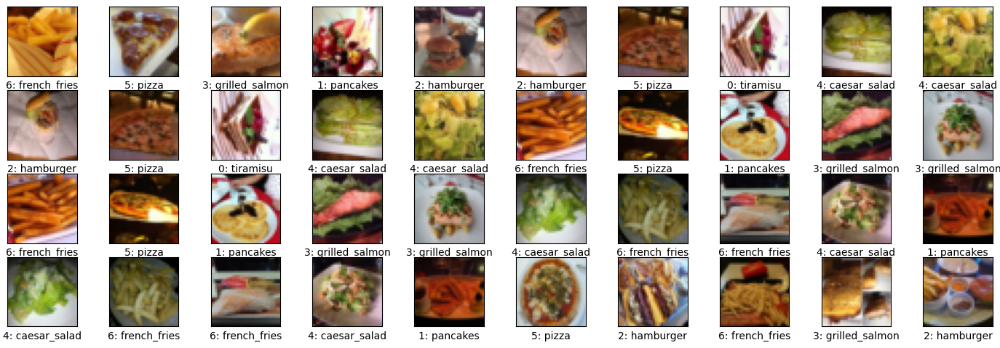

In [ ]:
# Show example images.

import numpy as np
import matplotlib.pyplot as plt
import torchvision.utils as vutils

def show_example_images(dataset):
    nrow = 4
    ncol = 10
    fig, ax = plt.subplots(nrow, ncol, figsize=(10, 4))

    X, y = next(iter(DataLoader(
            ds_food7,
            collate_fn=collate_fn1,
            batch_size=nrow * ncol,
            shuffle=True)))

    for i in range(nrow):
        for j in range(ncol):
            # img = minibatch['image'][5*i + j]
            # label = minibatch['label'][5*i + j]
            img = X[5*i + j]
            label = y[5*i + j]
            ax[i][j].imshow(np.transpose(img, [1, 2, 0]))
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])
            ax[i][j].set_xlabel(f'{label.item()}: {class2name[label.item()]}')

    fig.subplots_adjust(bottom=0.1, right=1.5, top=1.2)

show_example_images(dataset=ds_food7)

### How to use the Food-7 dataset

After executing the previous five cells, you will get the following objects.

- `dataloader_train`: `torch.data.util.Dataloader` object holding the training split of the dataset. The size is 6000.

- `dataloader_test`: `torch.data.util.Dataloader` object holding the test split of the dataset. The size is 1000.

- `class2name`: Python dictionary to map a numerically represented class to its name. For example, `class2name[0] == 'tiramisu'`.

- `ds_food7`: the Hugging Face `datasets.Dataset` object storing the whole dataset.

Each image has 3 channels and is of size $34 \times 34$. There are 7 classes. See the last code cell to learn how to use the dataloader.

Let's write a Python class (deriving from `torch.nn.Module`) for the LetNet-5 with the architecture :
- a convolution layer with 6 output channels and kernel_size 5
- a batch normalization layer
- a ReLU layer
- a max pooling layer with kernel size 2 and stride 2
- a convolution layer with 16 output channels and kernel_size 5
- a batch normalization layer
- a ReLU layer
- a max pooling layer with kernel size 2 and stride 2
- a `Flatten()` layer
- a fully connected layer with 256 output dimensions
- a ReLU layer
- a fully connected layer with 84 output dimensions
- a ReLU layer
- a fully connected layer with 7 output dimensions
in this order.

In [ ]:
#  Archtechture of Yann LeCun's LeNet-5.
class LeNet5(nn.Module):
    def __init__(self):
        super(LeNet5, self).__init__()
        # We can optionally use `Sequential` for grouping several layers.
        # It will be easier to define `forward`.
        self.block1 = nn.Sequential(
            nn.Conv2d(3, 6, kernel_size=5, stride=1, padding=0),
            nn.BatchNorm2d(6),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.block2 = nn.Sequential(
            nn.Conv2d(6, 16, kernel_size=5, stride=1, padding=0),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(400, 120)
        self.relu = nn.ReLU()
        self.fc1 = nn.Linear(120, 84)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(84, 7)

    def forward(self, x):
        out = self.block1(x)  # Second dimension is for channels,
                              # but we only have one channel.
        out = self.block2(out)
        out = self.flatten(out)
        out = self.fc(out)
        out = self.relu(out)
        out = self.fc1(out)
        out = self.relu1(out)
        out = self.fc2(out)
        return out

Let's define train_loop and eval_loop to train and evaluate the model.

In [ ]:
def train_loop(dataloader, model, loss_fn_mean, optimizer, device):

    model.train()

    for X,y in dataloader:

        # Reset gradients
        optimizer.zero_grad()

        X = X.to(device)
        y = y.to(device)

        # Forward
        pred = model(X)
        loss = loss_fn_mean(pred, y)

        # Backpropagation
        loss.backward()
        optimizer.step()


def eval_loop(dataloader, model, loss_fn_sum, device):

    model.eval()
    size = len(dataloader.dataset)
    loss, correct = 0., 0.

    with torch.no_grad():
        for X,y in dataloader:

            X = X.to(device)
            y = y.to(device)

            pred = model(X)
            loss += loss_fn_sum(pred, y).item()
            correct += (pred.argmax(1) == y).type(torch.float).sum().item()

    loss /= size
    correct /= size
    return loss, correct

We train the model using the CrossEntropyLoss, using the Adam optimizer on 10 epochs.

In [ ]:
# Training:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

modelLeNet5 = LeNet5().to(device)
loss_fn_mean=nn.CrossEntropyLoss(reduction='mean')
loss_fn_sum=nn.CrossEntropyLoss(reduction='sum')
optimizer=torch.optim.Adam(params=modelLeNet5.parameters(), lr=1e-3)
epochs=10

Let's print and vizualise the performance of model Let-Net5 on the
food classification tasks.

In [ ]:
losses_train_model = []
accuracies_train_model = []
losses_val_model = []
accuracies_val_model = []

for t in range(epochs):
    print(f"Epoch {t + 1}\n-------------------------------------------------")

    # Train loop
    train_loop(dataloader_train, modelLeNet5, loss_fn_mean, optimizer, device)

    # Evaluation loop
    loss_train, accuracy_train = eval_loop(dataloader_train, modelLeNet5, loss_fn_sum, device)
    print(f"Training set:   Accuracy: {(100 * accuracy_train): >0.1f}%, Avg loss: {loss_train: >8f}")

    loss_val, accuracy_val = eval_loop(dataloader_test, modelLeNet5, loss_fn_sum, device)
    print(f"Validation set: Accuracy: {(100 * accuracy_val): >0.1f}%, Avg loss: {loss_val: >8f}\n")

    # Store the loss and accuracy at each epoch
    losses_train_model.append(loss_train)
    accuracies_train_model.append(accuracy_train)

    losses_val_model.append(loss_val)
    accuracies_val_model.append(accuracy_val)

print("Done!")

Epoch 1
-------------------------------------------------
Training set:   Accuracy: 36.8%, Avg loss: 1.639037
Validation set: Accuracy: 34.4%, Avg loss: 1.709544

Epoch 2
-------------------------------------------------
Training set:   Accuracy: 38.1%, Avg loss: 1.688446
Validation set: Accuracy: 35.2%, Avg loss: 1.795635

Epoch 3
-------------------------------------------------
Training set:   Accuracy: 49.2%, Avg loss: 1.388465
Validation set: Accuracy: 42.1%, Avg loss: 1.535783

Epoch 4
-------------------------------------------------
Training set:   Accuracy: 47.2%, Avg loss: 1.422320
Validation set: Accuracy: 40.6%, Avg loss: 1.570878

Epoch 5
-------------------------------------------------
Training set:   Accuracy: 46.6%, Avg loss: 1.409569
Validation set: Accuracy: 42.1%, Avg loss: 1.599606

Epoch 6
-------------------------------------------------
Training set:   Accuracy: 52.0%, Avg loss: 1.322519
Validation set: Accuracy: 45.3%, Avg loss: 1.578883

Epoch 7
--------------

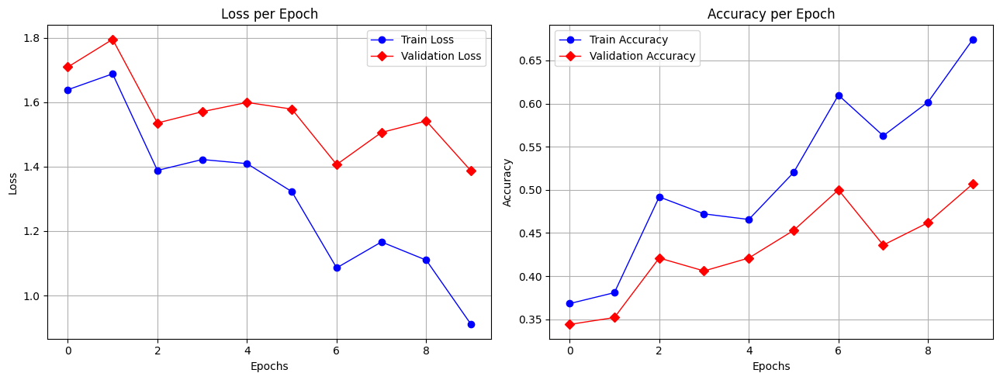

In [ ]:
# Create a figure with 2 subplots (side by side)
fig, ax = plt.subplots(1, 2, figsize=(13, 5))

# Plot Loss (left plot)
ax[0].plot(range(epochs), losses_train_model, label='Train Loss', color='blue', marker='o',linewidth=1)
ax[0].plot(range(epochs), losses_val_model, label='Validation Loss', color='red', marker='D',linewidth=1)
ax[0].set_title('Loss per Epoch')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()
ax[0].grid(True)

# Plot Accuracy (right plot)
ax[1].plot(range(epochs), accuracies_train_model, label='Train Accuracy', color='blue', marker='o',linewidth=1)
ax[1].plot(range(epochs), accuracies_val_model, label='Validation Accuracy', color='red', marker='D',linewidth=1)
ax[1].set_title('Accuracy per Epoch')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].legend()
ax[1].grid(True)

# Adjust layout for better spacing between plots
plt.tight_layout()

# Show the plot
plt.show()

Throughout the epochs, the loss seems decreasing while the accuracy is improving on both the training and the evaluation sets. The adjustement of the weights seems functionning. Throughout the 10 epochs, the accuracy improve by 0.25 (going from 0.3 to 0.55).

In [ ]:
loss_test_model, accuracy_test_model = eval_loop(dataloader_test, modelLeNet5, loss_fn_sum, device)
print(f"Validation set: Accuracy: {(100 * accuracy_test_model): >0.1f}%, Avg loss: {loss_test_model: >8f}\n")

Validation set: Accuracy: 50.7%, Avg loss: 1.386782



Let's plot the confusion matrix of the LeNet-5 model.

In [ ]:
# Get the test images and labels
X_test, y_test = collate_fn1(ds_food7_split['test'])

The code below is based on a first example provided by ChatGPT, which has been adjusted and improved.

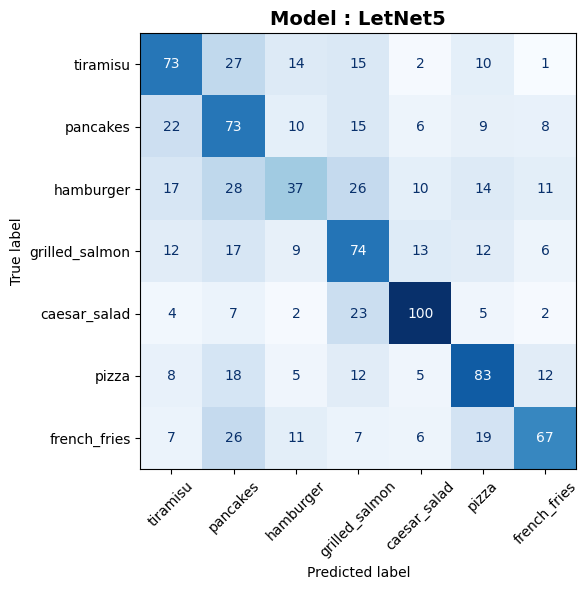

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Make predictions
pred = modelLeNet5(X_test)

y_pred = (pred.argmax(1)).type(torch.float)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot side-by-side confusion matrices
fig, ax = plt.subplots(1, 1, figsize=(12, 6))

# First confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class2name.values())
disp.plot(cmap='Blues', ax=ax, colorbar=False)
ax.set_title("Model : LetNet5", fontsize=14, fontweight='bold')

# Rotate axis labels
ax.tick_params(axis='x', labelrotation=45)  # Rotate x-axis labels
ax.tick_params(axis='y', labelrotation=0)   # Keep y-axis labels horizontal


# Adjust layout
plt.tight_layout()
plt.show()

The confusion matrix indicates that the LeNet-5 model misclassifies (a lot) :
- french_fries as pizza or pancakes
- ceaser_salad and hamburger as grilled_salmon
- hamburger as pancakes
- pancakes as tiramisu
- tiramisu as pancakes

We can visualize some of the false predictions as follows :

In [ ]:
# Visualize false predictions of the model
def visualize_model(model, dataloader, class_names, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Get the prediction of the model
            outputs = model(inputs)
            preds = (pred.argmax(1)).type(torch.int)

            for j in range(inputs.size()[0]):
              # Display only false prediction
              if labels[j] != preds[j]:

                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class2name[preds[j].item()]}',fontsize = 10)
                plt.imshow(np.transpose(inputs.cpu().data[j], [1, 2, 0]))

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

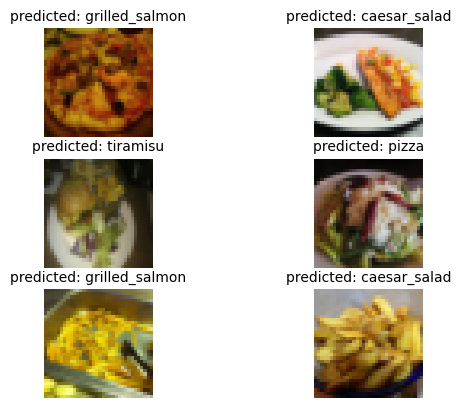

In [ ]:
# Visualize the false predictions of the model:
visualize_model(modelLeNet5, dataloader_test, class2name)

In the vizualisation above : in the first image, a **pizza** is misclassifies as **grilled_salmon** while, in the last image, a **french_fries** is misclassifies as **caesar_salad**.

## Question 3 (Small Project)
Find a dataset that has not appeared in the course and apply any method that we have learned (or any deep learning method that you have discovered yourself).


In this project, we apply the LSTM model to predict DOGDE coin crypto price. We also use the same architecture to train a GRU and a simpleRNN models on the same data to see how accurate the predictions are, compared to the LSTM predictions.  Part of this code is adapted from [1], [2] and [3].

---
[1]https://www.statology.org/how-to-build-lstm-models-for-time-series-prediction-in-python/

[2] https://www.datacamp.com/fr/tutorial/lstm-python-stock-market

[3] https://www.kaggle.com/code/charel/learn-by-example-rnn-lstm-gru-time-series/notebook


### Time series modeling

#### Required packages

In [ ]:
import numpy as np
from numpy import newaxis
import pandas as pd
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.layers import LSTM, GRU, SimpleRNN
from tensorflow.keras.models import Sequential
from keras import optimizers
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')


In [ ]:
# Enter in how much steps we will enroll the network.
Enrol_window = 50

print ('enrol window set to',Enrol_window )

enrol window set to 50


 The network will use the past 100 timesteps as input to predict the output at the next timestep.
This "window" acts as the memory length for the network, determining how far back in the time series the model looks.

#### Support functions

In [ ]:
# Initialize a MinMaxScaler for normalizing data between 0 and 1
sc = MinMaxScaler(feature_range=(0, 1))

# Function to load and preprocess data
def load_data(datasetname, column, seq_len):
    """
    Prepares the dataset for training and testing

    Parameters:
    - datasetname: Pandas DataFrame containing the dataset
    - column: Column name to use for data extraction, actually the ticker symbol
    - seq_len: Length of each sequence to consider (number of timesteps)
    - normalise_window: Boolean to determine if data should be normalized

    Returns:
    - x_train, y_train: Training data and corresponding labels
    - x_test, y_test: Testing data and corresponding labels
    """
    # Extract the relevant column from the dataset
    data = datasetname.loc[:, column]

    # Define the sequence length (input sequence + next value to predict)
    sequence_length = seq_len + 1
    result = []

    # Create overlapping sequences of length `seq_len + 1`
    for index in range(len(data) - sequence_length):
        result.append(data[index: index + sequence_length])


    # Normalize using custom logic instead of MinMaxScaler
    result = normalise_windows(result)

    # Convert the result to a NumPy array
    result = np.array(result)

    # Split the data: 90% for training, 10% for testing
    row_train = round(0.8 * result.shape[0])  # Index for the training/evaluation split
    row_eval = round(0.9 * result.shape[0])  # Index for the evaluation/testing split
    train = result[:int(row_train), :]        # Training data
    np.random.shuffle(train)           # Shuffle the training data for randomness

    # Separate eval data into inputs (x) and labels (y)
    x_train = train[:, :-1]  # All but the last value in each sequence
    y_train = train[:, -1]   # The last value in each sequence

    # Separate evaluation data into inputs (x) and labels (y)
    x_eval = result[int(row_train):int(row_eval), :-1]
    y_eval = result[int(row_train):int(row_eval), -1]

    # Separate testing data into inputs (x) and labels (y)
    x_test = result[int(row_eval):, :-1]
    y_test = result[int(row_eval):, -1]

    # Reshape the data to be compatible with RNN input (samples, timesteps, features)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
    x_eval = np.reshape(x_eval, (x_eval.shape[0], x_eval.shape[1], 1))
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))


    return [x_train, y_train, x_eval, y_eval, x_test, y_test]

# Function to normalize each window (sequence) in the dataset
def normalise_windows(window_data):
    """
    Normalizes a list of sequences using the first value of each sequence as a reference

    Parameters:
    - window_data: List of sequences to normalize

    Returns:
    - normalised_data: List of normalized sequences
    """
    normalised_data = []
    for window in window_data:
        # Normalize each value in the sequence relative to the first value
        normalised_window = [((float(p) / float(window[0])) - 1) for p in window]
        normalised_data.append(normalised_window)
    return normalised_data

# Function to predict a single continuous sequence
def predict_sequence_full(model, data, window_size):
    """
    Predicts a sequence by sliding the window forward one step at a time

    Parameters:
    - model: Trained RNN/LSTM/GRU model
    - data: Input data for prediction
    - window_size: Size of the sliding window (number of timesteps)

    Returns:
    - predicted: List of predicted values
    """
    curr_frame = data[0]  # Start with the first sequence
    predicted = []

    for i in range(len(data)):
        # Predict the next value based on the current sequence
        predicted.append(model.predict(curr_frame[newaxis, :, :])[0, 0])
        # Slide the window forward by adding the predicted value to the sequence
        curr_frame = curr_frame[1:]
        curr_frame = np.insert(curr_frame, [window_size - 1], predicted[-1], axis=0)

    return predicted

# Function to predict sequences in batches
def predict_sequences_multiple(model, data, window_size, prediction_len):
    """
    Predicts multiple sequences of a fixed length using a sliding window

    Parameters:
    - model: Trained RNN/LSTM/GRU model
    - data: Input data for prediction
    - window_size: Size of the sliding window (number of timesteps)
    - prediction_len: Length of each sequence to predict

    Returns:
    - prediction_seqs: List of predicted sequences
    """
    prediction_seqs = []

    # Divide the data into chunks based on prediction length
    for i in range(int(len(data) / prediction_len)):
        curr_frame = data[i * prediction_len]
        predicted = []

        for j in range(prediction_len):
            # Predict the next value
            predicted.append(model.predict(curr_frame[newaxis, :, :])[0, 0])
            # Slide the window forward by adding the predicted value
            curr_frame = curr_frame[1:]
            curr_frame = np.insert(curr_frame, [window_size - 1], predicted[-1], axis=0)

        prediction_seqs.append(predicted)

    return prediction_seqs

# Function to plot true data against predictions
def plot_results(predicted_data, true_data):
    """
    Plots the true data and predictions on the same graph

    Parameters:
    - predicted_data: List of predicted values
    - true_data: List of true values
    """
    fig = plt.figure(facecolor='white')
    ax = fig.add_subplot(111)
    ax.plot(true_data, label='True Data')  # Plot true data
    plt.plot(predicted_data, label='Prediction')  # Plot predictions
    plt.legend()
    plt.show()

# Function to plot multiple predicted sequences
def plot_results_multiple(predicted_data, true_data, prediction_len):
    """
    Plots multiple predicted sequences along with true data

    Parameters:
    - predicted_data: List of predicted sequences
    - true_data: List of true values
    - prediction_len: Length of each predicted sequence
    """
    fig = plt.figure(facecolor='white')
    ax = fig.add_subplot(111)
    ax.plot(true_data, label='True Data')  # Plot true data

    # Shift each predicted sequence to align with its start point
    for i, data in enumerate(predicted_data):
        padding = [None for _ in range(i * prediction_len)]
        plt.plot(padding + data, label='Prediction')  # Add shifted predictions

    plt.legend()
    plt.show()

#### Loading data

In [ ]:
import datetime
import yfinance as yfin

# Download stock prices from Yahoo Finance and set the time period for download
# Here we focus on the Adj close daily price
start = datetime.date(2017, 11, 11)
end = datetime.date(2024, 12, 12)

# Load the data
dataset = yfin.download(["DOGE-EUR"], start=start, end=end)['Adj Close']
dataset.head()

[*********************100%***********************]  1 of 1 completed


Ticker,DOGE-EUR
Date,
2017-11-11,0.001030
2017-11-12,0.000890
2017-11-13,0.001038
2017-11-14,0.001005
2017-11-15,0.001136


<Axes: xlabel='Date'>

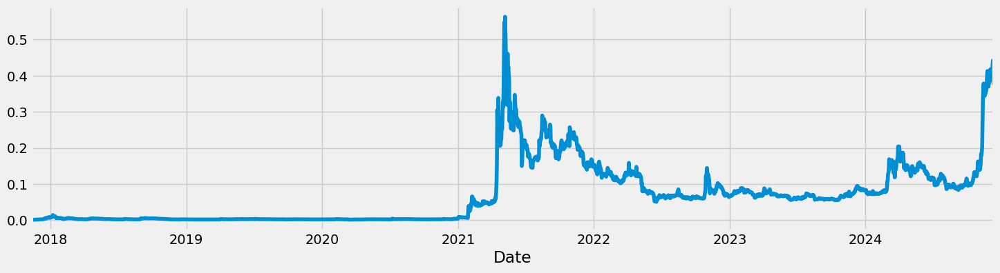

In [ ]:
# Evolution of DOGE cryptocurrency price since November 2017
dataset["DOGE-EUR"][:].plot(figsize=(16,4),legend=False)



#### Model training

<ipython-input-4-b87118762144>:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  normalised_window = [((float(p) / float(window[0])) - 1) for p in window]


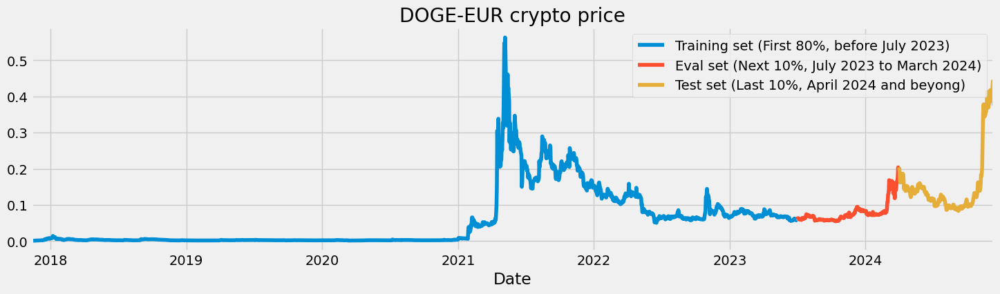

In [ ]:
# Prepare the dataset, note that the stock price data will be normalized between 0 and 1
# A label is the thing we're predicting
# A feature refers to the cryptocurrency price
# Selected 'DOGE-EUR'

feature_train, label_train, feature_eval, label_eval, feature_test, label_test = load_data(dataset, "DOGE-EUR", Enrol_window)

dataset["DOGE-EUR"][:'2023-06'].plot(figsize=(16,4),legend=True)
dataset["DOGE-EUR"]['2023-07':'2024-03'].plot(figsize=(16,4),legend=True) # 10% is used for evaluating data which is approximately July 2023
dataset["DOGE-EUR"]['2024-04':].plot(figsize=(16,4),legend=True) # 10% is used for testing data which is approximately April 2024
plt.legend(['Training set (First 80%, before July 2023)',
            'Eval set (Next 10%, July 2023 to March 2024)',
            'Test set (Last 10%, April 2024 and beyong)'])
plt.title('DOGE-EUR crypto price')
plt.show()

##### Model architecture

In [ ]:
def create_rnn_model(model_type="LSTM", input_shape=(10, 1), units=[50, 100],
                     dropout_rate=0.2, activation="linear", optimizer="adam", loss="mse"):
    """
    Create a sequential RNN model dynamically

    Args:
    - model_type:  type of RNN layer ("LSTM", "GRU", or "SimpleRNN")
    - input_shape:  shape of the input data (timesteps, features)
    - units: number of units for each RNN layer
    - dropout_rate: dropout rate for regularization
    - activation:  activation function for the output layer
    - optimizer: optimizer for training the model
    - loss: loss function for model compilation

    Returns:
    - model: compiled Keras Sequential model
    """
    model = Sequential()

    # Select the RNN layer type
    RNNLayer = {"LSTM": LSTM, "GRU": GRU, "SimpleRNN": SimpleRNN}.get(model_type)
    if RNNLayer is None:
        raise ValueError(f"Invalid model_type: {model_type}. Choose 'LSTM', 'GRU', or 'SimpleRNN'.")

    # Add the first RNN layer
    model.add(RNNLayer(units=units[0], return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))

    # Add additional RNN layers
    for u in units[1:-1]:
        model.add(RNNLayer(units=u, return_sequences=True))
        model.add(Dropout(dropout_rate))

    # Add the final RNN layer
    if len(units) > 1:
        model.add(RNNLayer(units=units[-1], return_sequences=False))
        model.add(Dropout(dropout_rate))

    # Add the output Dense layer
    model.add(Dense(1, activation=activation))

    # Compile the model
    model.compile(optimizer=optimizer, loss=loss)

    print("Model compiled successfully.")
    return model


In [ ]:
# Specifying models
model_LSTM = create_rnn_model(model_type="LSTM", input_shape=(10, 1), units=[50, 100],
                     dropout_rate=0.2, activation="linear", optimizer="adam", loss="mse")
model_GRU = create_rnn_model(model_type="GRU", input_shape=(10, 1), units=[50, 100],
                     dropout_rate=0.2, activation="linear", optimizer="adam", loss="mse")
model_SimpleRNN = create_rnn_model(model_type="SimpleRNN", input_shape=(10, 1), units=[50, 100],
                     dropout_rate=0.2, activation="linear", optimizer="adam", loss="mse")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model compiled successfully.
Model compiled successfully.
Model compiled successfully.


##### Training and prédictions

In [ ]:
#Train the model
model_LSTM.fit(feature_train, label_train, batch_size=512, epochs=50, validation_data = (feature_eval, label_eval))
model_GRU.fit(feature_train, label_train, batch_size=512, epochs=50, validation_data = (feature_eval, label_eval))
model_SimpleRNN.fit(feature_train, label_train, batch_size=512, epochs=50, validation_data = (feature_eval, label_eval))

Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 518ms/step - loss: 3.3510 - val_loss: 0.0594
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 518ms/step - loss: 1.9712 - val_loss: 0.1077
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 903ms/step - loss: 1.2663 - val_loss: 0.2829
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 423ms/step - loss: 1.3194 - val_loss: 0.0542
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 411ms/step - loss: 0.9574 - val_loss: 0.0331
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 419ms/step - loss: 0.9024 - val_loss: 0.0384
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 643ms/step - loss: 0.6446 - val_loss: 0.0339
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 600ms/step - loss: 0.6125 - val_loss: 0.0298
Epoch 9/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 409ms/step - loss: 0.5802 - val_loss: 0.0231
Epoch 10/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 429ms/step - loss: 0.4267 - val_loss: 0.0184
Epoch 11/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 410ms/step - loss: 0.3845 - val_loss: 0.0177
Epoch 12/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 418ms/step - loss: 0.4190 - val_lo

###### LSTM predictions

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step


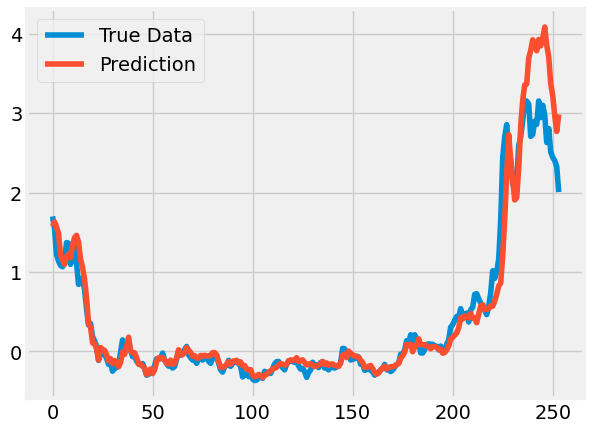

In [ ]:
# Predict the crypto price
predicted_stock_price_LSTM = model_LSTM.predict(feature_test)
plot_results(predicted_stock_price_LSTM,label_test)



###### GRU predictions

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step


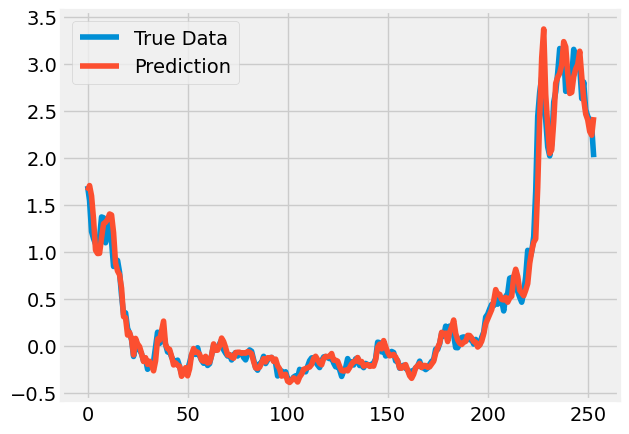

In [ ]:
predicted_stock_price_GRU = model_GRU.predict(feature_test)
plot_results(predicted_stock_price_GRU,label_test)

###### SimpleRNN predictions

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step


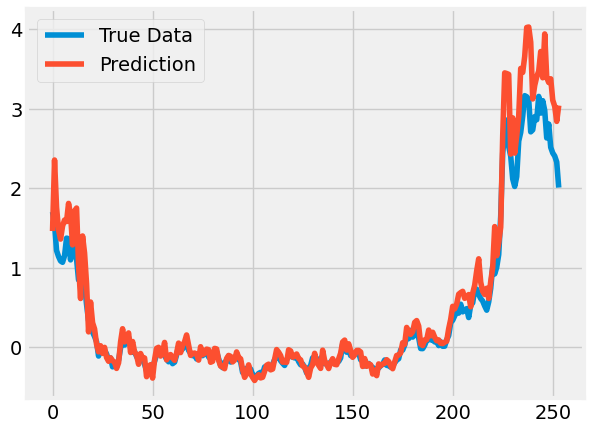

In [ ]:
predicted_stock_price_SimpleRNN = model_SimpleRNN.predict(feature_test)
plot_results(predicted_stock_price_SimpleRNN,label_test)

With less than five epoch the LSTM seems to be the most accurate but the predictions are note well accurate.

With 50 epoch, it comes that the GRU model is the most accurate. This sounds more friendly as awaited, regarding the nature of this model compared to the two others.

We should also remember that the Enrol_window fixed to 50 plays an important role in the training. In fact, the 50-days moving average is one the must used indicator by financial analyst for stock price analysis. It turns out that taking a 50-day enrol window is suitable for this cryptocurrency price as well.

We initially tried with a 100-day enrol window in the first place witout attending the same accuracy on predictions.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

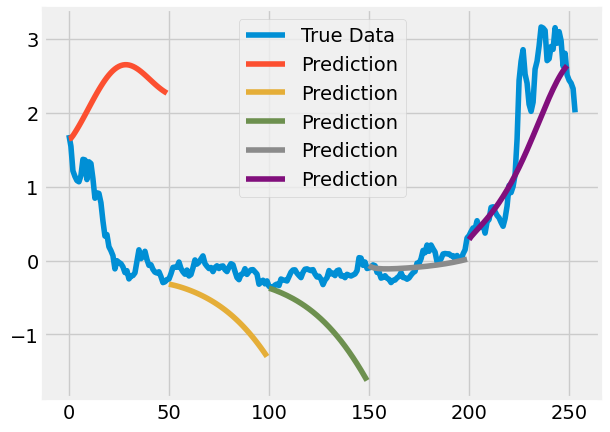

In [ ]:
predictions = predict_sequences_multiple(model_GRU, feature_test, Enrol_window, 50)
plot_results_multiple(predictions, label_test, 50)

--------------------------------------------------------------------------------

### predict poverty level of an area using satellite image

In this section, we present as second small project, whom the objective is to predict poverty level of an area using satellite image.

This project is based on the paper : [Using publicly available satellite imagery and deep learning to understand economic well-being in Africa](https://doi.org/10.1038/s41467-020-16185-w) . However, the project doesn't solely replicate the results of the article since all the necessary data are not available. Instead, using simply a remote sensing data of an area, we try to predict the level of asset (a proxy of poverty level) of households living in this area. This tasks may be relevant for many reasons :
- On one hand, collect each year the poverty level of areas in developing countries is costly (both financially and in time).
- On the other hand, remote sensing data from all regions of the globe are publicly available every year, and can be obtained quickly and easily.

Then, developing machine learning and deep learning models to predict poverty levels could be a way of obtaining theses economic data in real time, at no cost, and could be useful for better public policies towards the poor.

---------------------------------------------------------------------------------
The dataset used in this project can be found on [this drive](https://drive.google.com/drive/folders/15YaE7Wl3PLkTooAQipRnNfMbcXabAbMp)

A description of the dataset used in this project can be found [here](https://sustainlab-group.github.io/sustainbench/docs/datasets/sdg1/change_in_poverty.html)

We downloaded the data available on drive to our repository. It constains
- lsms.tar.gz : satellite images of taken from 5 fives countries in different year.
- lsms_asset_indices.csv : for each satellite image, we have the associated coordinates (lon, lat), the year, the country, level of asset (asset_index).

Next, we extracted the satellite image (lsms.tar.gz) into the folder *extracted_files*.


In [ ]:
!pip install tarfile

In [ ]:
import tarfile

# Specify the path to your tar.gz file
file_path = '/content/drive/MyDrive/Poverty prediction/lsms.tar.gz'
# Specify the extraction directory (e.g., current working directory or another path)
extract_path = '/content/drive/MyDrive/Poverty prediction/extracted_files/'

# Open and extract the tar.gz file
with tarfile.open(file_path, 'r:gz') as tar:
    tar.extractall(path=extract_path)
    print(f"Extracted all files to: {extract_path}")


Extracted all files to: /content/drive/MyDrive/Poverty prediction/extracted_files/


Let's visualize an example of satelitte image.

For each image, we have the capture of the area, in many channels (red, green, blue, near infrared, etc.) and nightlights of the area.

The top of the code below is a first example provided by ChatGPT which has been adjusted and improved.

Arrays stored in the .npz file: ['x']


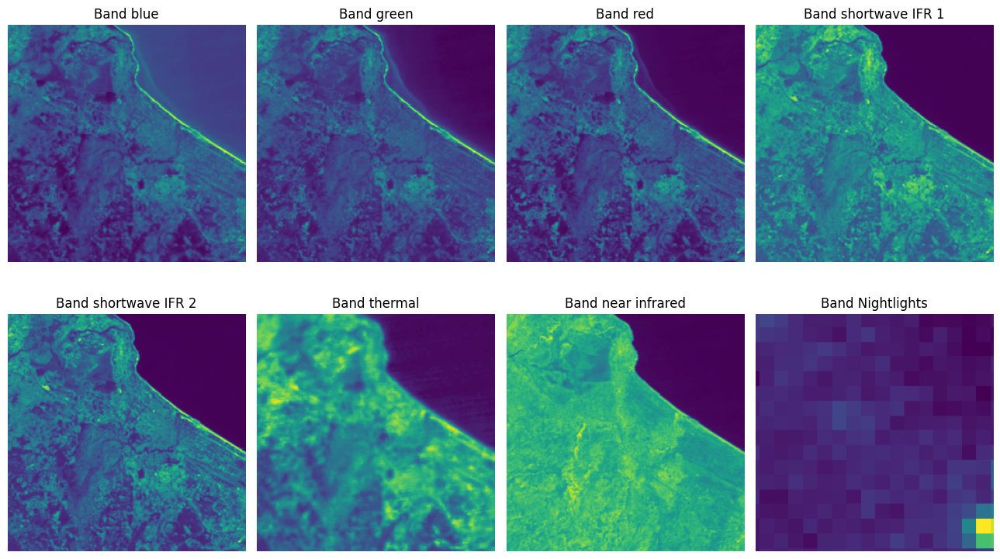

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Specify the path to your .npz file
file_path = '/content/drive/MyDrive/Poverty prediction/extracted_files/mw_2016/mw_10302010_2016.npz'

# Load the .npz file
data = np.load(file_path)

# List all arrays stored in the .npz file
print("Arrays stored in the .npz file:", data.files)

# Extract the array (replace 'satellite_image' with the actual key of the array)
array_name = 'x'  # Replace with the actual name of the array containing the data
satellite_data = data[array_name]
# Loop through all 8 bands and plot each one
pos = ["blue","green","red","shortwave IFR 1","shortwave IFR 2","thermal","near infrared","Nightlights"]
num_bands = 8
fig, axes = plt.subplots(2, 4, figsize=(13, 8))  # 2 rows and 4 columns of subplots

for i in range(num_bands):
    band = satellite_data[i]  # Access each band
    ax = axes[i // 4, i % 4]  # Get the correct subplot
    ax.imshow(band)
    ax.set_title(f'Band {pos[i]}')
    ax.axis('off')  # Remove axis for a cleaner view

plt.tight_layout()
plt.show()

However, for our project, we will only focus on the RGB bands (3 channels) of the image.

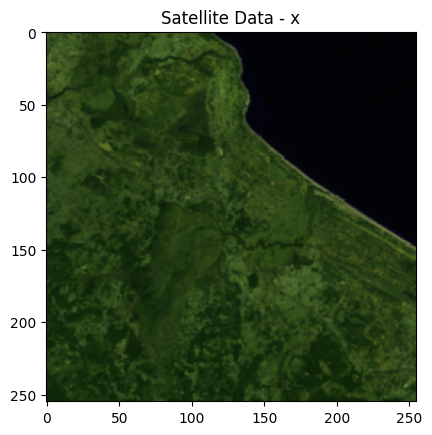

In [ ]:
# Get the RGB bands of the image
rgb_image = np.dstack([satellite_data[4], satellite_data[3], satellite_data[2]])

# Display the satellite data
plt.imshow(rgb_image)
plt.title(f"Satellite Data - {array_name}")
plt.show()

Let's have a look on the asset level associated to each satellite image. Those information are contained in the *lsms_asset_indices.csv* dataframe. Our main objective is to use the satellite image to predict the asset index.

In [ ]:
import numpy as np
import pandas as pd
# Path to the CSV file containing image IDs and their index_values
csv_file_path = '/content/drive/MyDrive/Poverty prediction/lsms_asset_indices.csv'

# Load the CSV file
df = pd.read_csv(csv_file_path)

df.head()

,lsms_id,country,cluster_id,year,lat,lon,asset_index,n
0,et_01010201403_2011,et,1010201403,2011,14.288590,38.210252,-2.324146,5
1,et_01010201403_2015,et,1010201403,2015,14.288590,38.210252,-2.030634,5
2,et_01010300106_2011,et,1010300106,2011,14.109761,38.473835,0.946298,6
3,et_01010300106_2015,et,1010300106,2015,14.109761,38.473835,1.348502,6
4,et_01010301804_2011,et,1010301804,2011,13.844084,38.480325,-2.194513,5




For this task, we have satelitte image of area in different countries and years :    
- Ethiopia in 2011 and 2015
- Malawi in 2010 and 2016
- Nigeria in 2010 and 2015
- Tanzania in 2008 and 2012
- Uganda in 2005, 2009, 2015

We can visualise all the data as follows [8] :    

[8] The code is based on a first example provided by ChatGPT, which has been adjusted and improved.

In [ ]:
import folium
from matplotlib.colors import Normalize, to_hex
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable, get_cmap


# Define cluster size (10m x 10m) in degrees (approximately)
cluster_size = 10 / 111000  # Convert 10m to degrees

# Define bins and generate discrete colors from 'viridis' colormap
bins = [-3, -2, -1, 0, 1, 2, 3,5]  # Define poverty level intervals
viridis_cmap = get_cmap('viridis', len(bins) - 1)  # Discretize 'viridis' colormap
bin_colors = [to_hex(viridis_cmap(i)) for i in range(len(bins) - 1)]  # Colors for bins

# Function to assign a color based on poverty level
def get_color(poverty):
    bin_index = np.digitize([poverty], bins, right=True)[0] - 1  # Find the bin index
    return bin_colors[bin_index]


# Initialize a Folium map
m = folium.Map(location=[0, 20], zoom_start=4)

# Add rectangles for each cluster
for _, row in df.iterrows():
    # Calculate bounds for the rectangle
    bounds = [
        [row["lat"] - cluster_size / 2, row["lon"] - cluster_size / 2],  # Bottom-left
        [row["lat"] + cluster_size / 2, row["lon"] + cluster_size / 2],  # Top-right
    ]
    # Get color for the poverty level from the discretized bins
    asset_index = row["asset_index"]
    color = get_color(asset_index)

    # Add a rectangle to the map
    folium.Rectangle(
        bounds,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.8,
        popup=f"Poverty Level {asset_index}",
    ).add_to(m)

# Add a legend to explain the bins and colors
from branca.colormap import StepColormap
colormap = StepColormap(
    bin_colors,
    index=bins,
    vmin = -3,
    vmax = 5,
    caption="Poverty Level (Discretized with Viridis)"
)
colormap.add_to(m)


# Save or display the map
m.save("poverty_clusters.html")
m


<ipython-input-14-1fb3937a613e>:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis_cmap = get_cmap('viridis', len(bins) - 1)  # Discretize 'viridis' colormap


The vizualisation above indicates that nigerian households, through the period, have more assets than those in Malawi, Uganda, Tanzania and Ethiopia.

Since, the most recent images are from Malawi in 2016, we will theses images as test sets. Our goal, is then to train a model using satellite images from previous year and other countries to predict the level of asset, and to use see how, this model perform on a new unsee data from Malawi in 2016.

This exercise is also a mimic of what happens in real, when we do have data on satellite image and level of poverty (proxy of assets) in previous years and want to predict the actual level of poverty using the current satellite images.

Let's associated the image and its labels (asset index) into a numpy dataset.

We will divided our dataset into train and test sets, when the test set contains only images from Malawi in 2016.

In [ ]:
import os

# Directory where the images (in .npz format) are stored
images_directory = '/content/drive/MyDrive/Poverty prediction/extracted_files/'


# Initialize a list to hold the combined image and label data
train_data = []
test_data = []

# Iterate over each row in the CSV file
for _, row in df.iterrows():
    # Get the image ID and corresponding label (index_value)
    image_id = row['lsms_id']  # Id
    label = row['asset_index']  # Asset index
    lon = row['lon']
    lat = row['lat']
    year = row['year']
    country = row['country']

    # Construct the file path for the .npz file based on the image ID
    npz_file_path = os.path.join(images_directory,f"{country}_{year}/", f"{image_id}.npz")

    # Load the image data from the .npz file
    with np.load(npz_file_path) as data:
        # Assume the image is stored under a key like 'image', adjust accordingly
        image_data = data['x']  # Replace 'image' with the actual key if different

        rgb_image = np.dstack([image_data[4], image_data[3], image_data[2]])

    # Create a dictionary containing the image and its label
    el = {"images": rgb_image, "label": label,"country" : country,"year":year,"lon":lon,"lat":lat}

    # Check if image is from Malawi 2016

    if country == "mw" and year == 2016:
      # Append the dictionary to the test dataset list
      test_data.append(el)
    else :
      # Append the dictionary to the train dataset list
      train_data.append(el)

# Now the datasets contain dictionaries with both images and labels
print(f"Train Dataset created with {len(train_data)} elements.")

print(f"Test Dataset created with {len(test_data)} elements.")


Train Dataset created with 2662 elements.
Test Dataset created with 101 elements.


In [ ]:
#from sklearn.model_selection import StratifiedShuffleSplit
# Create a stratification variable by combining year and country
#stratify = [f"{row['year']}_{row['country']}" for row in dataset]

# Initialize StratifiedShuffleSplit for the train-test split
#sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

# Perform the stratified split
#for train_index, test_index in sss.split(range(len(dataset)), stratify):
    # Split the dataset into training and testing using the indices
    #train_data = [dataset[i] for i in train_index]
    #test_data = [dataset[i] for i in test_index]

In [ ]:
#len(train_data),len(test_data)

(2210, 553)

Let's define a DataLoader on the train and test sets.

In [ ]:
# Prepare dataloaders.
import torch
from torch.utils.data import DataLoader
from torchvision.transforms import v2 as tvtf

def collate_fn1(minibatch):
    """ Transform each minibatch.
    """
    images = []
    labels = []

    for example in minibatch:
        images.append(example["images"].transpose(2,0,1))
        labels.append(example["label"])


    return torch.tensor(images), torch.tensor(labels)

dataloader_train = DataLoader(train_data, collate_fn=collate_fn1, batch_size=32,shuffle=True)
dataloader_test = DataLoader(test_data, collate_fn=collate_fn1, batch_size=32,shuffle = True)

Let's plot example of images in the training set[9].

[9] The code below is based code seen in lab of Deep learning at ENSAI.

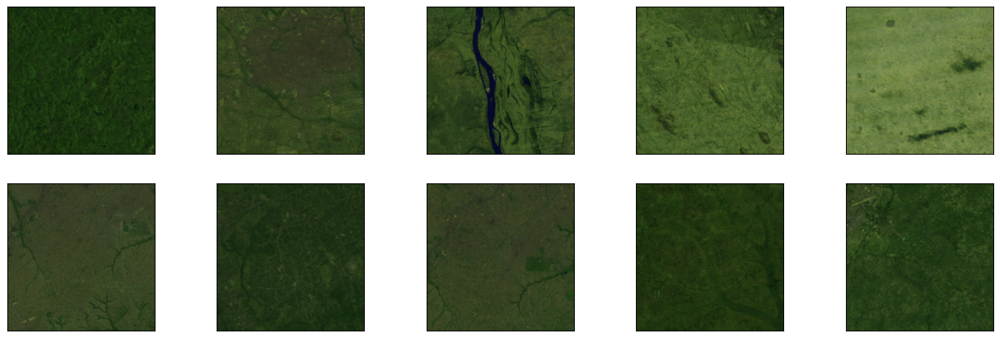

In [ ]:
# Show example images.

import numpy as np
import matplotlib.pyplot as plt
import torchvision.utils as vutils

def show_example_images(dataset, nrow = 2, ncol = 5):

    fig, ax = plt.subplots(nrow, ncol, figsize=(10, 4))

    X, y = next(iter(DataLoader(
            dataset,
            collate_fn=collate_fn1,
            batch_size=nrow * ncol,
            shuffle=True)))

    for i in range(nrow):
        for j in range(ncol):
            # img = minibatch['image'][5*i + j]
            # label = minibatch['label'][5*i + j]
            img = X[5*i + j]
            label = y[5*i + j]
            ax[i][j].imshow(img.permute(1, 2, 0))
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])
            #ax[i][j].set_xlabel(f'{label.item()}: {class2name[label.item()]}')

    fig.subplots_adjust(bottom=0.1, right=1.5, top=1.2)

# Train images
show_example_images(dataset=train_data)

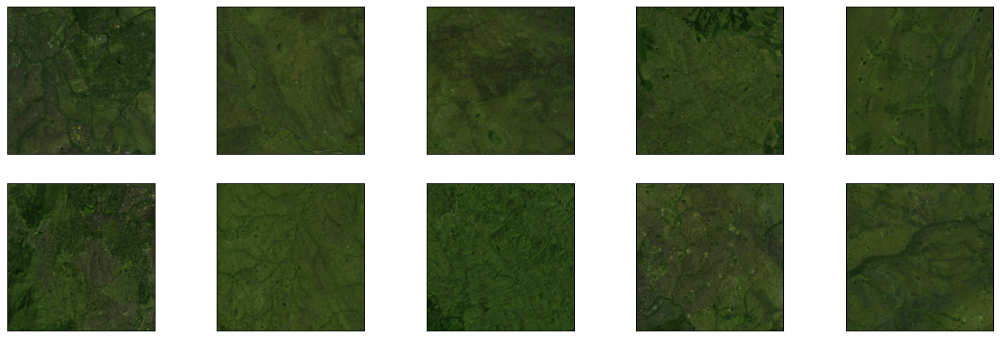

In [ ]:
# Plot example of images in test set
show_example_images(dataset=test_data, nrow = 2, ncol = 5)

We will use a LeNet-5 model to predict the level of poverty.

In [ ]:
from torch import nn
#  Archtechture of Yann LeCun's LeNet-5.
class LeNet5(nn.Module):
    def __init__(self):
        super(LeNet5, self).__init__()
        # We can optionally use `Sequential` for grouping several layers.
        # It will be easier to define `forward`.
        self.block1 = nn.Sequential(
            nn.Conv2d(3, 6, kernel_size=5, stride=1, padding=0),
            nn.BatchNorm2d(6),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.block2 = nn.Sequential(
            nn.Conv2d(6, 16, kernel_size=5, stride=1, padding=0),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(57600, 120)
        self.relu = nn.ReLU()
        self.fc1 = nn.Linear(120, 84)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(84, 1)

    def forward(self, x):
        out = self.block1(x)  # Second dimension is for channels,
                              # but we only have one channel.
        out = self.block2(out)
        out = self.flatten(out)
        out = self.fc(out)
        out = self.relu(out)
        out = self.fc1(out)
        out = self.relu1(out)
        out = self.fc2(out)
        return out

Let's define a train_loop and eval_loop to train and evaluate the LeNet-5 model.

In [ ]:
def train_loop(dataloader, model, loss_fn_mean, optimizer, device):

    model.train()

    for X,y in dataloader:

        # Reset gradients
        optimizer.zero_grad()

        X = X.to(device)
        y = y.to(device)

        # Forward
        pred = model(X)
        pred = torch.squeeze(pred)
        loss = loss_fn_mean(pred, y)

        # Backpropagation
        loss.backward()
        optimizer.step()


def eval_loop(dataloader, model, loss_fn_sum, device):

    model.eval()
    size = len(dataloader.dataset)
    loss, rmse = 0., 0.

    with torch.no_grad():
        for X,y in dataloader:

            X = X.to(device)
            y = y.to(device)

            pred = model(X)
            pred = torch.squeeze(pred)
            loss += loss_fn_sum(pred, y).item()
            # Calculate Root Mean Squared Error (RMSE)
            mse = torch.mean((pred - y) ** 2)  # Mean Squared Error
            rmse = torch.sqrt(mse).item()  # RMSE is the square root of MSE

    loss /= size
    return loss, rmse

We will use the Mean Squarred Error loss to train our model with Adam optimizer on 10 epochs.

In [ ]:
# Training:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

modelLeNet5 = LeNet5().to(device)
loss_fn = nn.MSELoss()  # Mean Squared Error loss for regression
optimizer=torch.optim.Adam(params=modelLeNet5.parameters(), lr=1e-3)
epochs=10

In [ ]:
losses_train_model = []
rmses_train_model = []
losses_val_model = []
rmses_val_model = []

for t in range(epochs):
    print(f"Epoch {t + 1}\n-------------------------------------------------")

    # Train loop
    train_loop(dataloader_train, modelLeNet5, loss_fn, optimizer, device)

    # Evaluation loop
    loss_train, rmse_train = eval_loop(dataloader_train, modelLeNet5, loss_fn, device)
    print(f"Training set:   RMSE: {(rmse_train): >0.1f}, Avg loss: {loss_train: >8f}")

    loss_val, rmse_val = eval_loop(dataloader_test, modelLeNet5, loss_fn, device)
    print(f"Validation set: RMSE: {(rmse_val): >0.1f}, Avg loss: {loss_val: >8f}\n")

    # Store the loss and accuracy at each epoch
    losses_train_model.append(loss_train)
    rmses_train_model.append(rmse_train)

    losses_val_model.append(loss_val)
    rmses_val_model.append(rmse_val)

print("Done!")

Epoch 1
-------------------------------------------------
Training set:   RMSE: 1.7, Avg loss: 0.072816
Validation set: RMSE: 0.7, Avg loss: 0.038473

Epoch 2
-------------------------------------------------
Training set:   RMSE: 1.4, Avg loss: 0.055565
Validation set: RMSE: 1.4, Avg loss: 0.047234

Epoch 3
-------------------------------------------------
Training set:   RMSE: 1.2, Avg loss: 0.053074
Validation set: RMSE: 1.3, Avg loss: 0.043910

Epoch 4
-------------------------------------------------
Training set:   RMSE: 1.3, Avg loss: 0.045898
Validation set: RMSE: 0.6, Avg loss: 0.029623

Epoch 5
-------------------------------------------------
Training set:   RMSE: 1.1, Avg loss: 0.043993
Validation set: RMSE: 0.5, Avg loss: 0.031256

Epoch 6
-------------------------------------------------
Training set:   RMSE: 1.2, Avg loss: 0.047585
Validation set: RMSE: 0.7, Avg loss: 0.030954

Epoch 7
-------------------------------------------------
Training set:   RMSE: 0.5, Avg loss:

Let's plot the performance of the model for each epochs

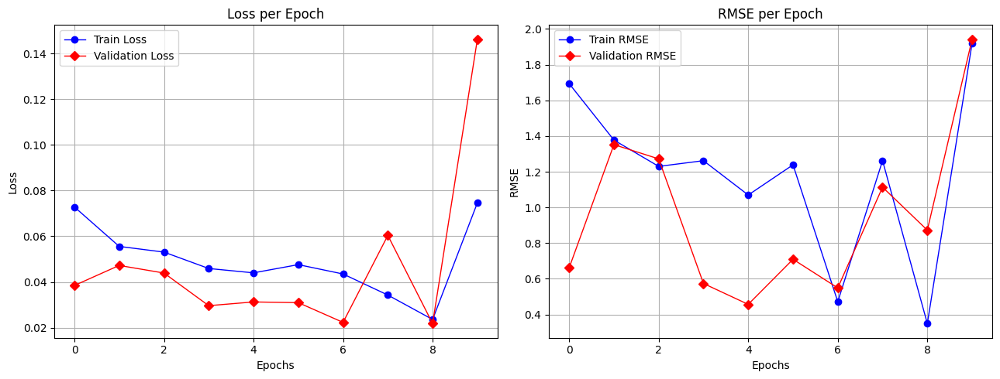

In [ ]:
# Create a figure with 2 subplots (side by side)
fig, ax = plt.subplots(1, 2, figsize=(13, 5))

# Plot Loss (left plot)
ax[0].plot(range(epochs), losses_train_model, label='Train Loss', color='blue', marker='o',linewidth=1)
ax[0].plot(range(epochs), losses_val_model, label='Validation Loss', color='red', marker='D',linewidth=1)
ax[0].set_title('Loss per Epoch')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()
ax[0].grid(True)

# Plot Accuracy (right plot)
ax[1].plot(range(epochs), rmses_train_model, label='Train RMSE', color='blue', marker='o',linewidth=1)
ax[1].plot(range(epochs), rmses_val_model, label='Validation RMSE', color='red', marker='D',linewidth=1)
ax[1].set_title('RMSE per Epoch')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('RMSE')
ax[1].legend()
ax[1].grid(True)

# Adjust layout for better spacing between plots
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
loss_test_model, rmse_test_model = eval_loop(dataloader_test, modelLeNet5, loss_fn, device)
print(f"Validation set: Accuracy: {(rmse_test_model): >0.1f}, Avg loss: {loss_test_model: >8f}\n")

Validation set: Accuracy: 2.1, Avg loss: 0.152439



The prediction of the asset level (proxy of poverty level) in Malawi in 2016 using remote sensing data seems to work quite well, like the prediction on the train dataset (remote sensing images and poverty level of previous years and in other countries).

Let's plot side by side the (true) asset level and their prediction in Malawi 2016.

In [ ]:
# Get the test images and labels
X_test, y_test = collate_fn1(test_data)

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Make predictions
pred = modelLeNet5(X_test)

In [ ]:
import folium
from matplotlib.colors import Normalize, to_hex
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable, get_cmap


# Define cluster size (10m x 10m) in degrees (approximately)
cluster_size = 10000 / 111000  # Convert 100m to degrees

# Define bins and generate discrete colors from 'viridis' colormap
bins = [-3, -2, -1, 0, 1, 2, 3,5]  # Define poverty level intervals
viridis_cmap = get_cmap('magma', len(bins) - 1)  # Discretize 'viridis' colormap
bin_colors = [to_hex(viridis_cmap(i)) for i in range(len(bins) - 1)]  # Colors for bins

# Function to assign a color based on poverty level
def get_color(poverty):
    bin_index = np.digitize([poverty], bins, right=True)[0] - 1  # Find the bin index
    return bin_colors[bin_index]


# Initialize a Folium map
asset_maps = folium.Map(location=[-13.2543, 34.3015], zoom_start=7)

pred_asset_maps = folium.Map(location=[-13.2543, 34.3015], zoom_start=7) # For the prediction

# Initialize index to get the predictions
k = 0

# Add rectangles for each cluster
for _, row in df.iterrows():

  # Check if the data is in test set
  if row["country"] == "mw" and row["year"] == 2016:
    # Calculate bounds for the rectangle
    bounds = [
        [row["lat"] - cluster_size / 2, row["lon"] - cluster_size / 2],  # Bottom-left
        [row["lat"] + cluster_size / 2, row["lon"] + cluster_size / 2],  # Top-right
    ]
    # Get color for the poverty level from the discretized bins
    asset_index = row["asset_index"]
    color = get_color(asset_index)

    # Get color for the prediction of the poverty level
    pred_asset_index = pred[k].item()
    k += 1
    color_pred = get_color(pred_asset_index)

    # Add a rectangle to the map (for asset index)
    folium.Rectangle(
        bounds,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.8,
        popup=f"Poverty Level {asset_index}",
    ).add_to(asset_maps)

    # Add a rectangle to the map (for the prediction of asset index)
    folium.Rectangle(
        bounds,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.8,
        popup=f"Poverty Level {asset_index}",
    ).add_to(pred_asset_maps)

# Add a legend to explain the bins and colors
from branca.colormap import StepColormap
colormap = StepColormap(
    bin_colors,
    index=bins,
    vmin = -3,
    vmax = 5,
    caption="Poverty Level (Discretized with Viridis)"
)
colormap.add_to(asset_maps)

import requests
import json

# Fetch GeoJSON data for Kenya (you can use any GeoJSON source)
url = "https://raw.githubusercontent.com/datasets/geo-boundaries-world-110m/master/countries.geojson"
geojson_data = requests.get(url).json()

# Add the Kenya GeoJSON to the map
folium.GeoJson(
    geojson_data,
    name="Boundaries",
    style_function=lambda feature: {
        "fillColor": "#ffffff",
        "color": "#000000",
        "weight": 1,
        "fillOpacity": 0.1,
    },
    highlight_function=lambda x: {"weight": 3, "color": "blue"},
).add_to(asset_maps)

folium.GeoJson(
    geojson_data,
    name="Boundaries",
    style_function=lambda feature: {
        "fillColor": "#ffffff",
        "color": "#000000",
        "weight": 1,
        "fillOpacity": 0.1,
    },
    highlight_function=lambda x: {"weight": 3, "color": "blue"},
).add_to(pred_asset_maps)

# Add layer control to toggle boundaries
folium.LayerControl().add_to(asset_maps)


# Save or display the map
asset_maps.save("poverty_clusters.html")
pred_asset_maps.save("pred_poverty_clusters.html")


<ipython-input-184-730c7c5dc351>:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis_cmap = get_cmap('magma', len(bins) - 1)  # Discretize 'viridis' colormap


In [ ]:
from IPython.core.display import display, HTML

# Read the content of the HTML files
with open('/content/poverty_clusters.html', 'r') as f:
    assets_map_content = f.read()

with open('/content/pred_poverty_clusters.html', 'r') as h:
    pred_assets_map_content = h.read()


In [ ]:
# Embed the maps side by side
html_content = f"""
<div style="display: flex; justify-content: space-around;">
    <div style="width: 45%; height: 500px; overflow: auto; border: 1px solid #ccc;">
        {assets_map_content}
    </div>

    <div style="width: 45%; height: 500px; overflow: auto; border: 1px solid #ccc;">
        {pred_assets_map_content}
    </div>
</div>
"""

display(HTML(html_content))

The previous vizualisation (*true labels at the right and prediction at the left*) seems to indicate that using remote sensing data and asset level from previous years and in others countries, we able to predict the asset level of Malawi in 2016.